# Clustering

# Import packages

pip install scanpy

pip install opencv-python

pip install k_means_constrained

In [238]:
import pandas as pd
import scanpy as sc
import cv2
# for kmeans clustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from k_means_constrained import KMeansConstrained
#for GMM
from sklearn import mixture
# import ARI score
from sklearn.metrics.cluster import adjusted_rand_score
from matplotlib import pyplot as plt
from sklearn import metrics

# function definition

## kmeans

In [391]:
def perform_kmeans(counts_for_coords, latent_space, img):
    x = list(counts_for_coords['x_coord'])
    y = list(counts_for_coords['y_coord'])
    #standardize
    mms = StandardScaler()
    mms.fit(counts)
    counts_transformed = mms.transform(counts)
    #kmeans
    kmeans = KMeans(n_clusters=10).fit(counts_transformed)
    # centroids
    centroids = kmeans.cluster_centers_
    frame = pd.DataFrame(latent_space)
    frame['cluster'] = kmeans.labels_.astype(float)
    #plt
    plt.imshow(img)
    plt.scatter(x,y, s = 1, c=kmeans.labels_.astype(float))
    
    return(counts_transformed, kmeans, frame)



## kmeans++

In [392]:
def perform_kmeans_plus_plus(counts_for_coords, latent_space, img):
    x = list(counts_for_coords['x_coord'])
    y = list(counts_for_coords['y_coord'])
    #standardize
    mms = StandardScaler()
    mms.fit(counts)
    counts_transformed = mms.transform(counts)
    #kmeans
    kmeans = KMeans(init='k-means++',max_iter=3000, n_clusters=10).fit(counts_transformed)
    # centroids
    centroids = kmeans.cluster_centers_
   
    frame = pd.DataFrame(latent_space)
    frame['cluster'] = kmeans.labels_.astype(float)
    #plt
    plt.imshow(img)
    plt.scatter(x,y, s = 1, c=kmeans.labels_.astype(float))
    
    return(counts_transformed, kmeans, frame)



## kmeans constrained

In [393]:
def kmeans_constrained(counts, latent_space, img):
    x = list(counts['x_coord'])
    y = list(counts['y_coord'])
    clf = KMeansConstrained(
        n_clusters=10,
        size_min=100,
        size_max=1000,
        random_state=0
    )
    clf.fit_predict(merged_dr_morpho_df_transformed)
    # save results
    labels = clf.labels_
    frame = pd.DataFrame(latent_space)
    frame['cluster'] = labels
    plt.imshow(img)
    plt.scatter(x,y, s = 1, c=clf.labels_)
    return(clf, labels, frame)


## GMM

In [394]:
def perform_gmm(counts_for_coords, latent_space, img):
    x = list(counts['x_coord'])
    y = list(counts['y_coord'])
    gm = mixture.GaussianMixture(n_components=10, random_state=0).fit(latent_space)
    labels = gm.predict(latent_space)
    frame = pd.DataFrame(latent_space)
    frame['cluster'] = labels
    plt.imshow(img)
    plt.scatter(x,y, s = 1, c=frame['cluster'])
    return(gm,labels,frame)

# 151507

## Import and preprocess data

In [272]:
visium_data_151507 = sc.read_visium("visium/151507/")
img = cv2.imread(f'visium/151507/spatial/151507.tif')
counts = pd.read_csv("dataframe/DPLFC_151507_counts_with_probes.csv", index_col=0)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [282]:
#standardize
mms = StandardScaler()
mms.fit(counts)
counts4 = mms.transform(counts)

In [273]:
counts2 = counts.drop(columns = ["x_coord", "y_coord"])

In [ ]:
def compute_dimensionality_reduction(df, df_meta, method):
    
    if method == 'PCA':
        pca = PCA(n_components = 2)
        reduced = pca.fit_transform(df)
    return

In [274]:
#for visualization
from sklearn.decomposition import PCA

In [283]:
pca = PCA(n_components = 2000)
reduced = pca.fit_transform(counts4)

In [284]:
df_reduced = pd.DataFrame({'X1': reduced[:, 0], 'X2': reduced[:, 1]})

In [ ]:
plt.scatter(df_reduced["X1"], df_reduced["X2"])

In [269]:
df_reduced.columns

Index(['X1', 'X2'], dtype='object')

In [ ]:
df_reduced

In [277]:
counts3 = counts.copy()

In [278]:
counts3 = counts3.reset_index(drop=True)
counts3

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AL354822.1,AC023491.2,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,y_coord,x_coord
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2514,3276
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8520,9178
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2878,5133
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9581,3462
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7663,2779
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6239,7464
4222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9466,5045
4223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9703,4218
4224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7906,4017


In [279]:
counts3["X1"] = df_reduced["X1"]
counts3["X2"] = df_reduced["X2"]
counts3

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,y_coord,x_coord,X1,X2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2514,3276,-128.455410,11.333333
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8520,9178,85.675508,8.330490
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2878,5133,-19.428020,-28.591461
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9581,3462,-57.430099,31.036154
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7663,2779,22.756840,0.414441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6239,7464,9.691561,-13.054039
4222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9466,5045,-49.880679,16.987674
4223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9703,4218,-132.363781,16.269101
4224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7906,4017,8.301453,12.753858


In [280]:
counts3 = counts3.drop(columns = ["x_coord", "y_coord"])
counts3

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AL354822.1,AC023491.2,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,X1,X2
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-128.455410,11.333333
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,85.675508,8.330490
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-19.428020,-28.591461
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-57.430099,31.036154
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.756840,0.414441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4221,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.691561,-13.054039
4222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-49.880679,16.987674
4223,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-132.363781,16.269101
4224,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.301453,12.753858


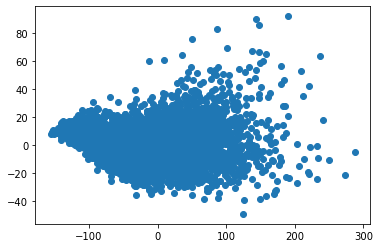

In [281]:
plt.scatter(counts3["X1"], counts3["X2"])

ValueError: 'c' argument has 4226 elements, which is inconsistent with 'x' and 'y' with size 2695.

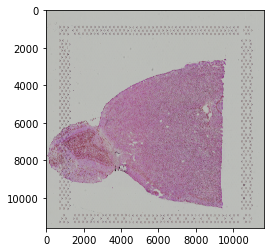

In [289]:
perform_gmm(counts, df_reduced, img)

In [271]:
counts

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,y_coord,x_coord,X1,X2
AAACAACGAATAGTTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2514,3276,NaN,NaN
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8520,9178,NaN,NaN
AAACAATCTACTAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2878,5133,NaN,NaN
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9581,3462,NaN,NaN
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7663,2779,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6239,7464,NaN,NaN
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9466,5045,NaN,NaN
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9703,4218,NaN,NaN
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7906,4017,NaN,NaN


In [264]:
counts.join(df_reduced)

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,y_coord,x_coord,X1,X2
AAACAACGAATAGTTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2514,3276,NaN,NaN
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8520,9178,NaN,NaN
AAACAATCTACTAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,2878,5133,NaN,NaN
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9581,3462,NaN,NaN
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7663,2779,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,6239,7464,NaN,NaN
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9466,5045,NaN,NaN
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,9703,4218,NaN,NaN
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,7906,4017,NaN,NaN


In [46]:
visium_data_151507

AnnData object with n_obs × n_vars = 4226 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [47]:
file_fold = "metadata_DPLFC"

In [48]:
# add ground_truth
df_meta = pd.read_csv(file_fold + '/metadata_151507.tsv', sep='\t')
df_meta_layer = df_meta['layer_guess']
visium_data_151507.obs['ground_truth'] = df_meta_layer.values

##  With mopho features

In [49]:
dataset_with_morphological_features = "151507_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/151507_merged_DR_morph_features.csv", index_col=0)

## Normalize data

In [53]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

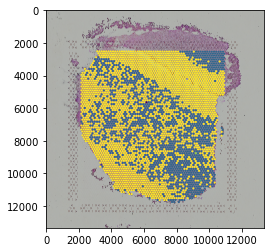

In [54]:
kmeans_counts_transformed_151507_with_morphological_features, kmeans_151507_with_morphological_features, frame_kmeans_151507_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df_transformed, img)

### kmeans ++

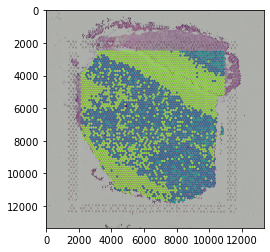

In [55]:
kmeans_plus_counts_transformed_151507_with_morphological_features, kmeans_plus_151507_with_morphological_features, frame_kmeans_plus_151507_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df_transformed, img)

### kmeans constrained

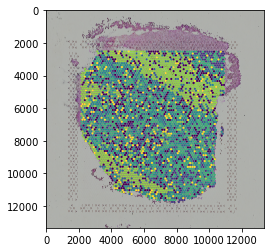

In [56]:
kmeans_constrained_counts_transformed_151507_with_morphological_features, kmeans_constrained_151507_with_morphological_features, frame_kmeans_constrained_151507_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df_transformed, img)

### GMM

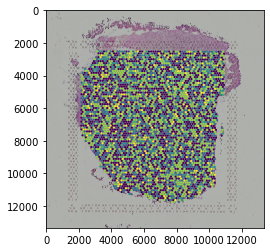

In [57]:
gmm_151507_with_morphological_features,gmm_labels_151507_with_morphological_features,frame_gmm_151507_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [58]:
dataset_without_morphological_features = "_151507_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/DPLFC_151507_latent_space.csv")

In [59]:
#standardize
mms = StandardScaler()
mms.fit(latent_space)
latent_space_transformed = mms.transform(latent_space)

## Perform clustering 

### kmeans

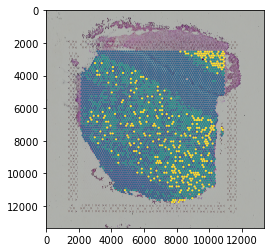

In [60]:
kmeans_counts_transformed_151507_without_morphological_features, kmeans_151507_without_morphological_features, frame_kmeans_151507_without_morphological_features = perform_kmeans(counts, latent_space_transformed, img)

### kmeans ++

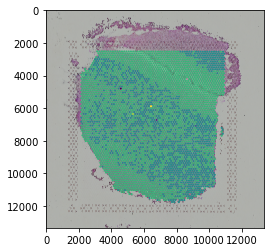

In [61]:
kmeans_plus_counts_transformed_151507_without_morphological_features, kmeans_plus_151507_without_morphological_features, frame_kmeans_plus_151507_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space_transformed, img)

### kmeans constrained

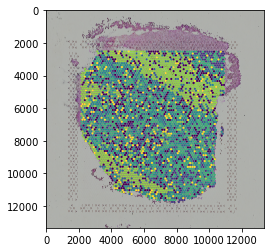

In [62]:
kmeans_constrained_counts_transformed_151507_with_morphological_features, kmeans_constrained_151507_with_morphological_features, frame_kmeans_constrained_151507_without_morphological_features = kmeans_constrained(counts, latent_space_transformed, img)

### GMM

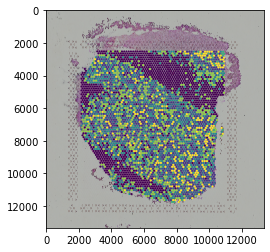

In [63]:
gmm_151507_without_morphological_features, gmm_labels_151507_without_morphological_features, frame_gmm_151507_without_morphological_features = perform_gmm(counts, latent_space_transformed, img)

## Calculate ARI

## Preprocess counts df

In [64]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_151507_with_morphological_features['cluster'])
counts_cluster_kmeans_151507_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_151507_with_morphological_features['cluster'])
kmeans_plus_151507_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_151507_with_morphological_features['cluster'])
kmeans_constrained_151507_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_151507_with_morphological_features['cluster'])
gmm_151507_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_151507_without_morphological_features['cluster'])
kmeans_151507_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_151507_without_morphological_features['cluster'])
kmeans_plus_151507_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_151507_without_morphological_features['cluster'])
kmeans_constrained_151507_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_151507_without_morphological_features['cluster'])
gmm_151507_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_151507_without_morphological_features

,cluster_gmm_without_morpho
AAACAACGAATAGTTC-1,0
AAACAAGTATCTCCCA-1,1
AAACAATCTACTAGCA-1,3
AAACACCAATAACTGC-1,1
AAACAGCTTTCAGAAG-1,3
...,...
TTGTTGTGTGTCAAGA-1,5
TTGTTTCACATCCAGG-1,5
TTGTTTCATTAGTCTA-1,0
TTGTTTCCATACAACT-1,2


In [65]:
counts_cluster

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAACGAATAGTTC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2514,3276,6.0,5.0,2,3,2.0,4.0,2,0
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8520,9178,2.0,3.0,2,3,6.0,3.0,2,1
AAACAATCTACTAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2878,5133,6.0,5.0,0,6,2.0,4.0,0,3
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9581,3462,2.0,2.0,2,3,3.0,3.0,2,1
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7663,2779,2.0,2.0,2,3,3.0,4.0,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6239,7464,6.0,5.0,3,5,2.0,4.0,3,5
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9466,5045,6.0,2.0,3,0,2.0,4.0,3,5
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9703,4218,6.0,5.0,5,0,2.0,4.0,5,0
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7906,4017,2.0,2.0,4,6,3.0,3.0,4,2


In [66]:
gmm_151507_with_morphological_features

,cluster_gmm
AAACAACGAATAGTTC-1,3
AAACAAGTATCTCCCA-1,3
AAACAATCTACTAGCA-1,6
AAACACCAATAACTGC-1,3
AAACAGCTTTCAGAAG-1,3
...,...
TTGTTGTGTGTCAAGA-1,5
TTGTTTCACATCCAGG-1,0
TTGTTTCATTAGTCTA-1,0
TTGTTTCCATACAACT-1,6


## Preprocess AnnData object

In [67]:
visium_data_151507.obs['cluster_kmeans'] = counts_cluster_kmeans_151507_with_morphological_features
visium_data_151507.obs['cluster_kmeans_plus'] = kmeans_plus_151507_with_morphological_features
visium_data_151507.obs['cluster_kmeans_constrained'] = kmeans_constrained_151507_with_morphological_features
visium_data_151507.obs['cluster_gmm'] = gmm_151507_with_morphological_features
visium_data_151507.obs['cluster_kmeans_without_morpho'] = kmeans_151507_without_morphological_features
visium_data_151507.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_151507_without_morphological_features
visium_data_151507.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_151507_without_morphological_features
visium_data_151507.obs['cluster_gmm_without_morpho'] = gmm_151507_without_morphological_features

In [68]:
visium_data_151507.obs

,in_tissue,array_row,array_col,ground_truth,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAACGAATAGTTC-1,1,0,16,Layer1,6.0,5.0,2,3,2.0,4.0,2,0
AAACAAGTATCTCCCA-1,1,50,102,Layer3,2.0,3.0,2,3,6.0,3.0,2,1
AAACAATCTACTAGCA-1,1,3,43,Layer1,6.0,5.0,0,6,2.0,4.0,0,3
AAACACCAATAACTGC-1,1,59,19,WM,2.0,2.0,2,3,3.0,3.0,2,1
AAACAGCTTTCAGAAG-1,1,43,9,Layer6,2.0,2.0,2,3,3.0,4.0,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,Layer3,6.0,5.0,3,5,2.0,4.0,3,5
TTGTTTCACATCCAGG-1,1,58,42,Layer6,6.0,2.0,3,0,2.0,4.0,3,5
TTGTTTCATTAGTCTA-1,1,60,30,WM,6.0,5.0,5,0,2.0,4.0,5,0
TTGTTTCCATACAACT-1,1,45,27,Layer6,2.0,2.0,4,6,3.0,3.0,4,2


In [69]:
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['ground_truth'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_kmeans'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_kmeans_plus'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_kmeans_constrained'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_gmm'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_kmeans_without_morpho'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_151507 = visium_data_151507[~pd.isnull(visium_data_151507.obs['cluster_gmm_without_morpho'])]

In [71]:
ARI_1 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_kmeans'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_1'] = ARI_1
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_kmeans_plus'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_kmeans_constrained'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_gmm'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_kmeans_without_morpho'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_kmeans_plus_without_morpho'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_kmeans_constrained_without_morpho'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_151507.obs['cluster_gmm_without_morpho'], visium_data_151507.obs['ground_truth'])
visium_data_151507.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

ARI_cluster_kmeans: 0.056055929801564375
ARI_cluster_kmeans_plus: 0.1111653844011491
ARI_cluster_kmeans_constrained: 0.08738092684445087
cluster_gmm: 0.002335917237352308
ARI_cluster_kmeans_without_morpho: 0.09555149345304746
ARI_cluster_kmeans_plus_without_morpho: 0.04301981998041157
ARI_cluster_kmeans_constrained_without_morpho: 0.08738092684445087
ARI_cluster_gmm_without_morpho: 0.11808677117197931


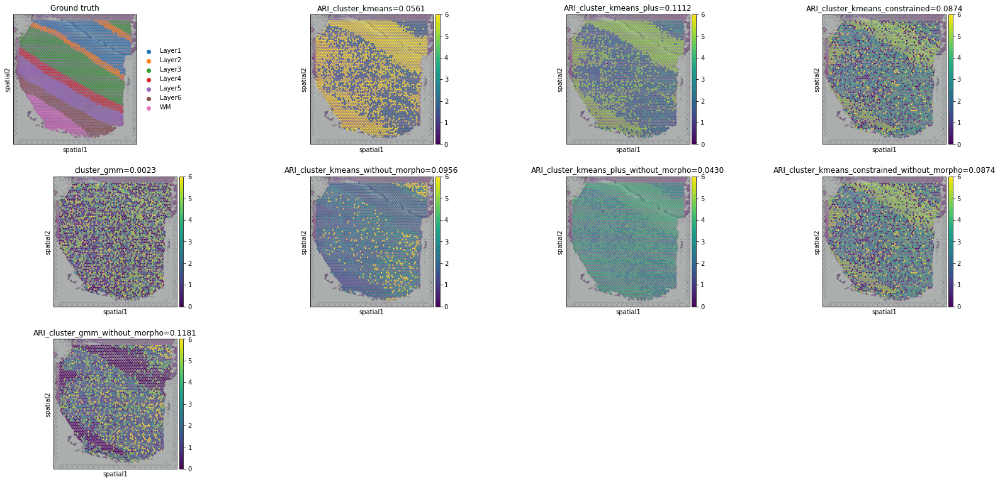

In [72]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_151507,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)

# 151673

## Import and preprocess data

In [130]:
visium_data_151673 = sc.read_visium("visium/151673/")
img = cv2.imread(f'visium/151673/spatial/151673.tif')
counts = pd.read_csv("dataframe/DPLFC_151673_counts_with_probes.csv", index_col=0)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [131]:
visium_data_151673

AnnData object with n_obs × n_vars = 3639 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [132]:
file_fold = "metadata_DPLFC"

In [133]:
# add ground_truth
df_meta = pd.read_csv(file_fold + '/metadata_151673.tsv', sep='\t')
df_meta_layer = df_meta['layer_guess']
visium_data_151673.obs['ground_truth'] = df_meta_layer.values

##  With mopho features

In [134]:
dataset_with_morphological_features = "151673_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/151673_merged_DR_morph_features.csv", index_col=0)

In [135]:
merged_dr_morpho_df

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,...,Texture inertia,Max Intensity,Mean Intensity,Min Intensity,Modus,Texture Anisotropy,Texture Entropy,Texture Major Axis,Texture Major Direction,Texture Minor Axis
0,21.807194,2.567029,18.867867,-10.539822,18.429330,23.193333,-2.492150,-12.771133,11.181767,-12.429247,...,24655.804335,185.546249,12.264198,8.463478,8.463478,0.391970,10.790670,15332.926348,7.818946,9322.877987
1,4.963645,0.535576,4.181831,-2.415662,4.203759,5.209475,-0.629136,-2.923047,2.560918,-2.862252,...,1618.433606,8.463478,8.463478,8.463478,8.463478,0.309978,9.258061,957.640507,170.366037,660.793099
2,10.389523,1.186608,8.911389,-5.034423,8.785227,11.000340,-1.229374,-6.098672,5.336255,-5.943906,...,35126.131286,157.659729,19.153144,8.463478,8.463478,0.417149,12.145731,22191.683061,12.652386,12934.448225
3,12.620265,1.456959,10.859351,-6.111198,10.668478,13.383902,-1.475507,-7.401599,6.479130,-7.211139,...,718.754990,8.463478,8.463478,8.463478,8.463478,0.701569,7.691404,553.556567,69.644816,165.198424
4,11.459588,1.318880,9.847275,-5.549852,9.691551,12.145718,-1.349747,-6.722358,5.886029,-6.552395,...,4840.751040,244.590134,143.749484,76.612083,76.612083,0.255347,10.316672,2774.620980,155.915538,2066.130059
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3634,12.075862,1.390215,10.384676,-5.847615,10.211443,12.802610,-1.415864,-7.079898,6.198486,-6.904453,...,1304.076246,185.878036,94.982050,54.194717,76.988534,0.234354,8.455272,738.583184,62.651479,565.493062
3635,7.792270,0.875981,6.649979,-3.781140,6.595135,8.232330,-0.942436,-4.577901,4.011072,-4.470164,...,2136.844877,204.436279,97.361415,43.033115,69.631537,0.176914,8.881623,1172.103244,37.428655,964.741634
3636,5.715069,0.624974,4.838155,-2.778266,4.839576,6.012091,-0.712080,-3.364617,2.945536,-3.289347,...,1962.139308,151.397873,87.672327,55.034466,75.784594,0.201726,9.130217,1091.123449,61.622434,871.015859
3637,6.489996,0.721456,5.514525,-3.151353,5.493414,6.839572,-0.798647,-3.815844,3.344400,-3.729513,...,3332.342163,149.781265,99.026361,63.721416,93.430554,0.141696,9.754150,1793.216605,3.073473,1539.125558


## Normalize data

In [136]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

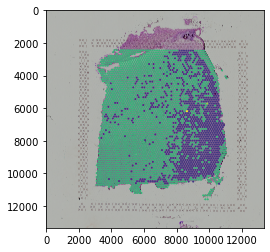

In [137]:
kmeans_counts_transformed_151673_with_morphological_features, kmeans_151673_with_morphological_features, frame_kmeans_151673_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df_transformed, img)

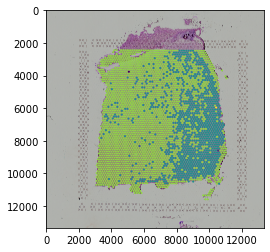

In [81]:
kmeans_counts_transformed_151673_with_morphological_features, kmeans_151673_with_morphological_features, frame_kmeans_151673_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df, img)

In [138]:
tsne_df = pd.read_csv("/../../sbgenomics/project-files/data/pca_umap_tsne/DPLFC_151673_df_embeddings_tsne.csv")

In [139]:
tsne_df

,Unnamed: 0,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,...,AL354822.1,AC023491.2,AC004556.1,AC233755.2,AC233755.1,AC240274.1,AC213203.1,FAM231C,X1,X2
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-58.071300,27.328300
1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-39.583830,12.526501
2,2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.521990,-45.788270
3,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.155405,-75.911960
4,4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.676579,-19.417048
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3634,3634,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.781760,-67.311280
3635,3635,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,55.376083,35.942300
3636,3636,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-18.098700,32.727985
3637,3637,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.114917,55.972897


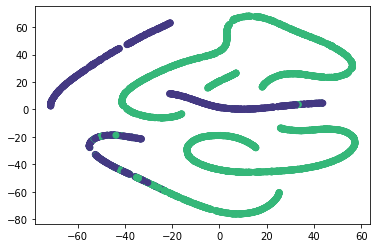

In [141]:
plt.scatter(tsne_df["X1"], tsne_df["X2"], c=kmeans_151673_with_morphological_features.labels_.astype(float))

### kmeans ++

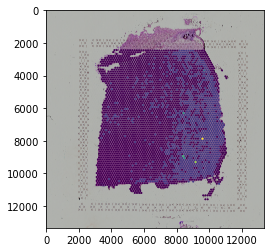

In [82]:
kmeans_plus_counts_transformed_151673_with_morphological_features, kmeans_plus_151673_with_morphological_features, frame_kmeans_plus_151673_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df_transformed, img)

### kmeans constrained

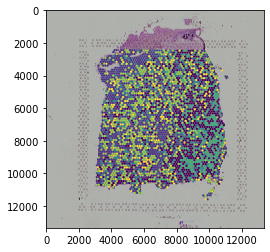

In [142]:
kmeans_constrained_counts_transformed_151673_with_morphological_features, kmeans_constrained_151673_with_morphological_features, frame_kmeans_constrained_151673_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df_transformed, img)

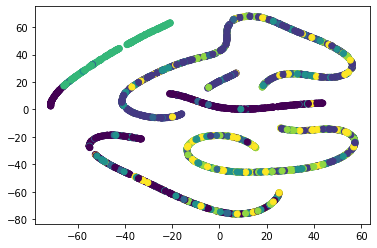

In [144]:
plt.scatter(tsne_df["X1"], tsne_df["X2"], c=kmeans_constrained_counts_transformed_151673_with_morphological_features.labels_.astype(float))

### GMM

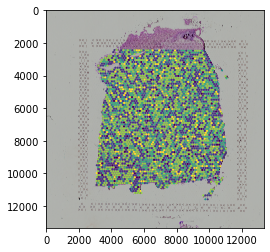

In [84]:
gmm_151673_with_morphological_features,gmm_labels_151673_with_morphological_features,frame_gmm_151673_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [147]:
dataset_without_morphological_features = "_151673_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/_1_DPLFC_151673_latent_space.csv")

In [148]:
#standardize
mms = StandardScaler()
mms.fit(latent_space)
latent_space_transformed = mms.transform(latent_space)

## Perform clustering 

### kmeans

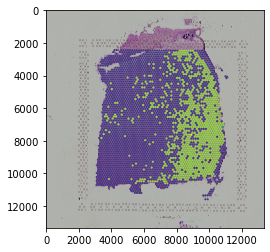

In [149]:
kmeans_counts_transformed_151673_without_morphological_features, kmeans_151673_without_morphological_features, frame_kmeans_151673_without_morphological_features = perform_kmeans(counts, latent_space_transformed, img)

In [ ]:
kmeans_counts_transformed_151673_without_morphological_features, kmeans_151673_without_morphological_features, frame_kmeans_151673_without_morphological_features = perform_kmeans(counts, latent_space, img)

### kmeans ++

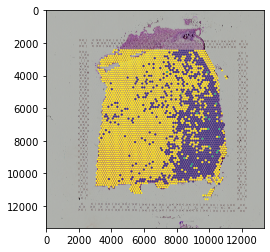

In [89]:
kmeans_plus_counts_transformed_151673_without_morphological_features, kmeans_plus_151673_without_morphological_features, frame_kmeans_plus_151673_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space_transformed, img)

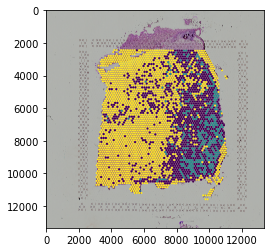

In [99]:
kmeans_plus_counts_transformed_151673_without_morphological_features, kmeans_plus_151673_without_morphological_features, frame_kmeans_plus_151673_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space, img)

### kmeans constrained

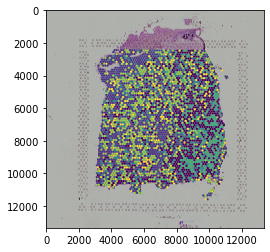

In [90]:
kmeans_constrained_counts_transformed_151673_with_morphological_features, kmeans_constrained_151673_with_morphological_features, frame_kmeans_constrained_151673_without_morphological_features = kmeans_constrained(counts, latent_space_transformed, img)

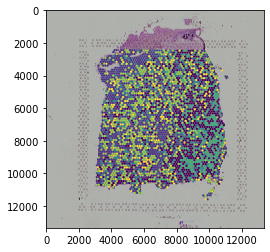

In [100]:
kmeans_constrained_counts_transformed_151673_with_morphological_features, kmeans_constrained_151673_with_morphological_features, frame_kmeans_constrained_151673_without_morphological_features = kmeans_constrained(counts, latent_space, img)

### GMM

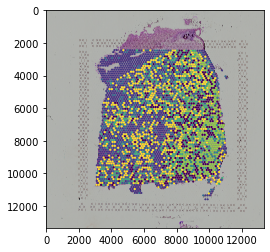

In [91]:
gmm_151673_without_morphological_features, gmm_labels_151673_without_morphological_features, frame_gmm_151673_without_morphological_features = perform_gmm(counts, latent_space_transformed, img)

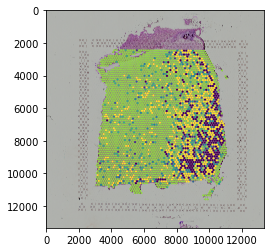

In [101]:
gmm_151673_without_morphological_features, gmm_labels_151673_without_morphological_features, frame_gmm_151673_without_morphological_features = perform_gmm(counts, latent_space, img)

## Calculate ARI

## Preprocess counts df

In [145]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_151673_with_morphological_features['cluster'])
counts_cluster_kmeans_151673_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_151673_with_morphological_features['cluster'])
kmeans_plus_151673_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_151673_with_morphological_features['cluster'])
kmeans_constrained_151673_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_151673_with_morphological_features['cluster'])
gmm_151673_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_151673_without_morphological_features['cluster'])
kmeans_151673_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_151673_without_morphological_features['cluster'])
kmeans_plus_151673_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_151673_without_morphological_features['cluster'])
kmeans_constrained_151673_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_151673_without_morphological_features['cluster'])
gmm_151673_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_151673_without_morphological_features

,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1
AAACAATCTACTAGCA-1,5
AAACACCAATAACTGC-1,5
AAACAGAGCGACTCCT-1,1
AAACAGCTTTCAGAAG-1,5
...,...
TTGTTTCACATCCAGG-1,4
TTGTTTCATTAGTCTA-1,4
TTGTTTCCATACAACT-1,5
TTGTTTGTATTACACG-1,5


In [146]:
counts_cluster

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8468,9791,1.0,1.0,3,0,1,1,1,1
AAACAATCTACTAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2807,5769,4.0,0.0,2,6,5,5,5,5
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9505,4068,4.0,0.0,3,0,5,5,5,5
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4151,9271,4.0,0.0,2,6,1,1,1,1
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7583,3393,4.0,0.0,5,5,5,5,5,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9396,5653,4.0,0.0,6,4,4,4,4,4
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9630,4825,4.0,0.0,6,4,4,4,4,4
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7831,4631,4.0,0.0,1,4,5,5,5,5
TTGTTTGTATTACACG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11193,5571,4.0,0.0,1,5,5,5,5,5


In [ ]:
gmm_151673_with_morphological_features

## Preprocess AnnData object

In [103]:
visium_data_151673.obs['cluster_kmeans'] = counts_cluster_kmeans_151673_with_morphological_features
visium_data_151673.obs['cluster_kmeans_plus'] = kmeans_plus_151673_with_morphological_features
visium_data_151673.obs['cluster_kmeans_constrained'] = kmeans_constrained_151673_with_morphological_features
visium_data_151673.obs['cluster_gmm'] = gmm_151673_with_morphological_features
visium_data_151673.obs['cluster_kmeans_without_morpho'] = kmeans_151673_without_morphological_features
visium_data_151673.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_151673_without_morphological_features
visium_data_151673.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_151673_without_morphological_features
visium_data_151673.obs['cluster_gmm_without_morpho'] = gmm_151673_without_morphological_features

In [ ]:
visium_data_151673.obs

In [104]:
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['ground_truth'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_plus'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_constrained'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_gmm'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_without_morpho'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_gmm_without_morpho'])]

In [105]:
ARI_1 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_1'] = ARI_1
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_plus'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_constrained'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_gmm'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_plus_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_constrained_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_gmm_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

ARI_cluster_kmeans: 0.025747986762241337
ARI_cluster_kmeans_plus: 0.023298963510741136
ARI_cluster_kmeans_constrained: 0.030820063254210817
cluster_gmm: -0.0004766744166245313
ARI_cluster_kmeans_without_morpho: 0.0020244021771637206


/tmp/ipykernel_77/4109085208.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  visium_data_151673.uns['ARI_1'] = ARI_1
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


ARI_cluster_kmeans_plus_without_morpho: 0.0020244021771637206
ARI_cluster_kmeans_constrained_without_morpho: 0.0020244021771637206
ARI_cluster_gmm_without_morpho: 0.0020244021771637206


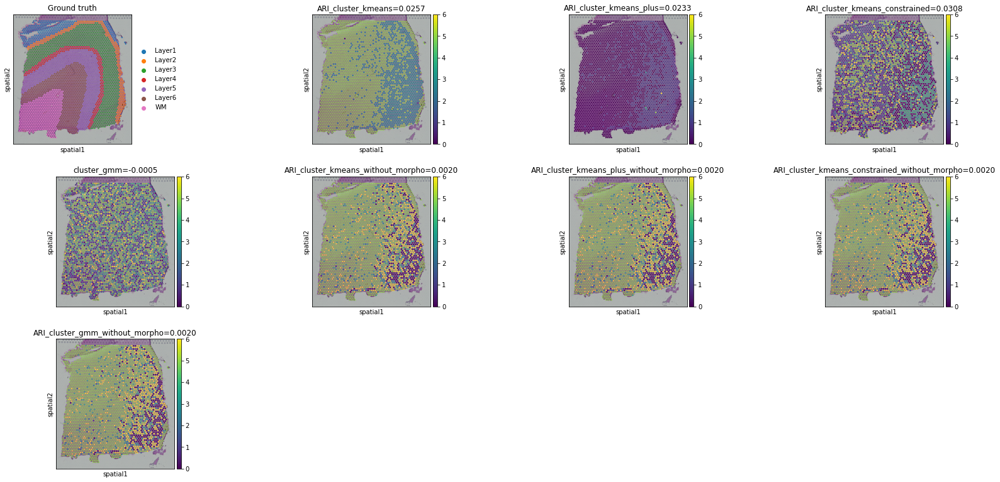

In [106]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_151673,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)

# 151671

## Import and preprocess data

In [213]:
visium_data_151671 = sc.read_visium("visium/151671/")
img = cv2.imread(f'visium/151671/spatial/151671.tif')
counts = pd.read_csv("dataframe/DPLFC_151671_counts_with_probes.csv", index_col=0)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [214]:
visium_data_151671

AnnData object with n_obs × n_vars = 4110 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [215]:
file_fold = "metadata_DPLFC"

In [216]:
# add ground_truth
df_meta = pd.read_csv(file_fold + '/metadata_151671.tsv', sep='\t')
df_meta_layer = df_meta['layer_guess']
visium_data_151671.obs['ground_truth'] = df_meta_layer.values

##  With mopho features

In [217]:
dataset_with_morphological_features = "151671_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/151671_merged_DR_morph_features.csv", index_col=0)

## Normalize data

In [218]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

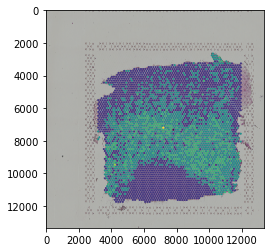

In [219]:
kmeans_counts_transformed_151671_with_morphological_features, kmeans_151671_with_morphological_features, frame_kmeans_151671_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df, img)

### kmeans ++

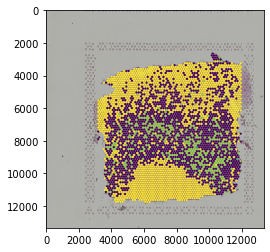

In [220]:
kmeans_plus_counts_transformed_151671_with_morphological_features, kmeans_plus_151671_with_morphological_features, frame_kmeans_plus_151671_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df, img)

### kmeans constrained

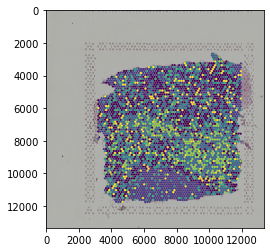

In [221]:
kmeans_constrained_counts_transformed_151671_with_morphological_features, kmeans_constrained_151671_with_morphological_features, frame_kmeans_constrained_151671_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df, img)

### GMM

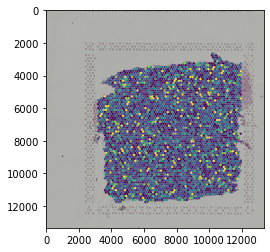

In [222]:
gmm_151671_with_morphological_features,gmm_labels_151671_with_morphological_features,frame_gmm_151671_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [223]:
dataset_without_morphological_features = "_151671_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/DPLFC_151671_latent_space.csv")

In [224]:
#standardize
mms = StandardScaler()
mms.fit(latent_space)
merged_dr_morpho_df_transformed = mms.transform(latent_space)

## Perform clustering 

### kmeans

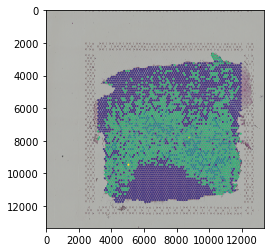

In [225]:
kmeans_counts_transformed_151671_without_morphological_features, kmeans_151671_without_morphological_features, frame_kmeans_151671_without_morphological_features = perform_kmeans(counts, latent_space, img)

### kmeans ++

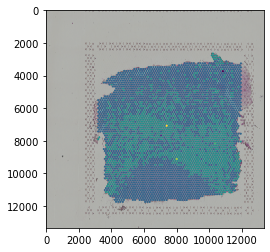

In [226]:
kmeans_plus_counts_transformed_151671_without_morphological_features, kmeans_plus_151671_without_morphological_features, frame_kmeans_plus_151671_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space, img)

### kmeans constrained

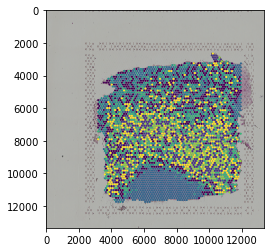

In [227]:
kmeans_constrained_counts_transformed_151671_with_morphological_features, kmeans_constrained_151671_with_morphological_features, frame_kmeans_constrained_151671_without_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df, img)

### GMM

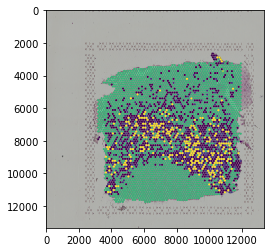

In [228]:
gmm_151671_without_morphological_features, gmm_labels_151671_without_morphological_features, frame_gmm_151671_without_morphological_features = perform_gmm(counts, latent_space, img)

## Calculate ARI

## Preprocess counts df

In [229]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_151671_with_morphological_features['cluster'])
counts_cluster_kmeans_151671_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_151671_with_morphological_features['cluster'])
kmeans_plus_151671_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_151671_with_morphological_features['cluster'])
kmeans_constrained_151671_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_151671_with_morphological_features['cluster'])
gmm_151671_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_151671_without_morphological_features['cluster'])
kmeans_151671_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_151671_without_morphological_features['cluster'])
kmeans_plus_151671_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_151671_without_morphological_features['cluster'])
kmeans_constrained_151671_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_151671_without_morphological_features['cluster'])
gmm_151671_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_151671_without_morphological_features

,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1
AAACACCAATAACTGC-1,1
AAACAGAGCGACTCCT-1,1
AAACAGCTTTCAGAAG-1,1
AAACAGGGTCTATATT-1,1
...,...
TTGTTTCACATCCAGG-1,4
TTGTTTCATTAGTCTA-1,4
TTGTTTCCATACAACT-1,4
TTGTTTGTATTACACG-1,4


In [230]:
counts_cluster

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8636,10214,5,5,5,4,3.0,3.0,5,1
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9702,4497,1,1,1,2,3.0,3.0,1,1
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4322,9672,1,1,1,2,3.0,3.0,1,1
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7784,3813,1,1,1,0,3.0,3.0,1,1
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8264,4087,5,5,5,4,3.0,3.0,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9586,6081,3,3,3,1,2.0,2.0,3,4
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9824,5255,4,4,4,1,2.0,2.0,4,4
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8026,5052,3,3,3,0,2.0,2.0,3,4
TTGTTTGTATTACACG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11383,6009,2,2,2,0,2.0,2.0,2,4


In [231]:
gmm_151671_with_morphological_features

,cluster_gmm
AAACAAGTATCTCCCA-1,4
AAACACCAATAACTGC-1,2
AAACAGAGCGACTCCT-1,2
AAACAGCTTTCAGAAG-1,0
AAACAGGGTCTATATT-1,4
...,...
TTGTTTCACATCCAGG-1,1
TTGTTTCATTAGTCTA-1,1
TTGTTTCCATACAACT-1,0
TTGTTTGTATTACACG-1,0


## Preprocess AnnData object

In [232]:
visium_data_151671.obs['cluster_kmeans'] = counts_cluster_kmeans_151671_with_morphological_features
visium_data_151671.obs['cluster_kmeans_plus'] = kmeans_plus_151671_with_morphological_features
visium_data_151671.obs['cluster_kmeans_constrained'] = kmeans_constrained_151671_with_morphological_features
visium_data_151671.obs['cluster_gmm'] = gmm_151671_with_morphological_features
visium_data_151671.obs['cluster_kmeans_without_morpho'] = kmeans_151671_without_morphological_features
visium_data_151671.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_151671_without_morphological_features
visium_data_151671.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_151671_without_morphological_features
visium_data_151671.obs['cluster_gmm_without_morpho'] = gmm_151671_without_morphological_features

In [233]:
visium_data_151671.obs

,in_tissue,array_row,array_col,ground_truth,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1,50,102,Layer5,5,5,5,4,3.0,3.0,5,1
AAACACCAATAACTGC-1,1,59,19,Layer6,1,1,1,2,3.0,3.0,1,1
AAACAGAGCGACTCCT-1,1,14,94,Layer3,1,1,1,2,3.0,3.0,1,1
AAACAGCTTTCAGAAG-1,1,43,9,Layer5,1,1,1,0,3.0,3.0,1,1
AAACAGGGTCTATATT-1,1,47,13,Layer5,5,5,5,4,3.0,3.0,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,Layer6,3,3,3,1,2.0,2.0,3,4
TTGTTTCATTAGTCTA-1,1,60,30,Layer6,4,4,4,1,2.0,2.0,4,4
TTGTTTCCATACAACT-1,1,45,27,Layer5,3,3,3,0,2.0,2.0,3,4
TTGTTTGTATTACACG-1,1,73,41,WM,2,2,2,0,2.0,2.0,2,4


In [234]:
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['ground_truth'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_plus'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_constrained'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_gmm'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_without_morpho'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_gmm_without_morpho'])]

In [235]:
ARI_1 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_1'] = ARI_1
print('Dataset:', dataset)
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_plus'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_constrained'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_gmm'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_plus_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_constrained_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_gmm_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

Dataset: _151507_without_morphological_features
ARI_cluster_kmeans: 0.1092237780253691
ARI_cluster_kmeans_plus: 0.1092237780253691
ARI_cluster_kmeans_constrained: 0.1092237780253691
cluster_gmm: -0.0013389536033941666
ARI_cluster_kmeans_without_morpho: 0.10985523025854192
ARI_cluster_kmeans_plus_without_morpho: 0.10985523025854192
ARI_cluster_kmeans_constrained_without_morpho: 0.1092237780253691
ARI_cluster_gmm_without_morpho: 0.1263461969464135


/tmp/ipykernel_95/1303059501.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  visium_data_151671.uns['ARI_1'] = ARI_1
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


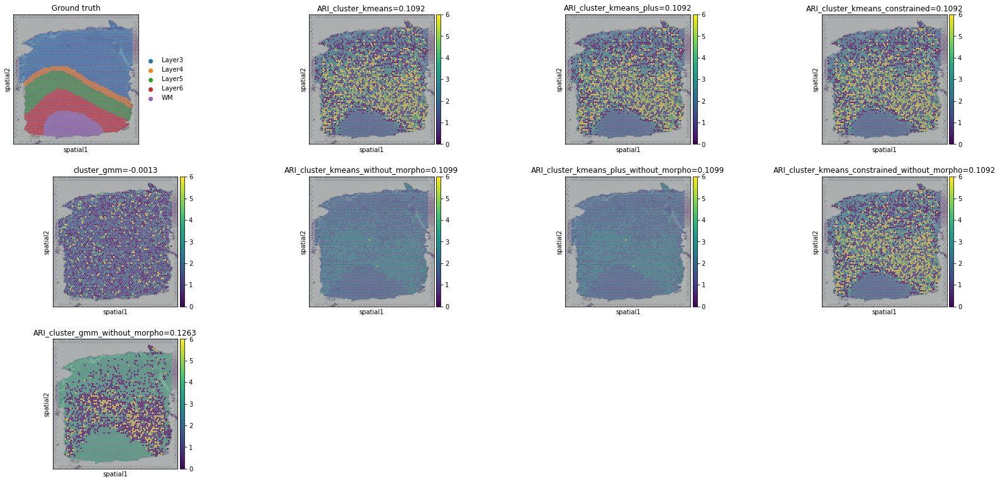

In [236]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_151671,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)

# 151669

## Import and preprocess data

In [150]:
visium_data_151669 = sc.read_visium("visium/151669/")
img = cv2.imread(f'visium/151669/spatial/151669.tif')
counts = pd.read_csv("dataframe/DPLFC_151669_counts_with_probes.csv", index_col=0)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [151]:
visium_data_151669

AnnData object with n_obs × n_vars = 3661 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [152]:
file_fold = "metadata_DPLFC"

In [153]:
# add ground_truth
df_meta = pd.read_csv(file_fold + '/metadata_151669.tsv', sep='\t')
df_meta_layer = df_meta['layer_guess']
visium_data_151669.obs['ground_truth'] = df_meta_layer.values

##  With mopho features

In [154]:
dataset_with_morphological_features = "151669_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/151669_merged_DR_morph_features.csv", index_col=0)

## Normalize data

In [155]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

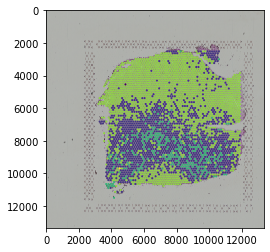

In [156]:
kmeans_counts_transformed_151669_with_morphological_features, kmeans_151669_with_morphological_features, frame_kmeans_151669_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df, img)

### kmeans ++

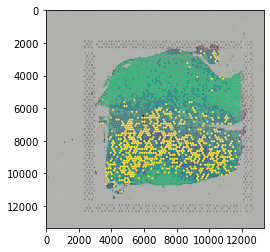

In [157]:
kmeans_plus_counts_transformed_151669_with_morphological_features, kmeans_plus_151669_with_morphological_features, frame_kmeans_plus_151669_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df, img)

### kmeans constrained

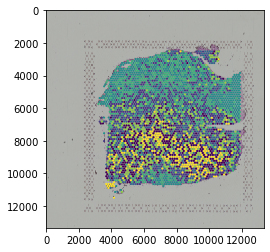

In [176]:
kmeans_constrained_counts_transformed_151669_with_morphological_features, kmeans_constrained_151669_with_morphological_features, frame_kmeans_constrained_151669_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df, img)

### GMM

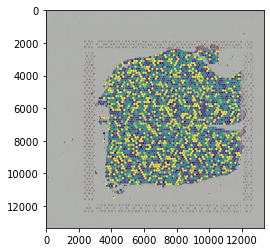

In [159]:
gmm_151669_with_morphological_features,gmm_labels_151669_with_morphological_features,frame_gmm_151669_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [160]:
dataset_without_morphological_features = "_151669_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/DPLFC_151669_latent_space.csv")

In [161]:
#standardize
mms = StandardScaler()
mms.fit(latent_space)
merged_dr_morpho_df_transformed = mms.transform(latent_space)

## Perform clustering 

### kmeans

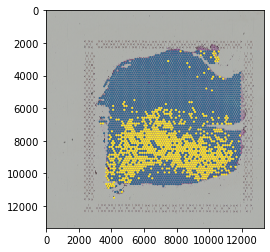

In [162]:
kmeans_counts_transformed_151669_without_morphological_features, kmeans_151669_without_morphological_features, frame_kmeans_151669_without_morphological_features = perform_kmeans(counts, latent_space, img)

### kmeans ++

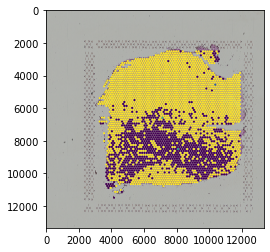

In [163]:
kmeans_plus_counts_transformed_151669_without_morphological_features, kmeans_plus_151669_without_morphological_features, frame_kmeans_plus_151669_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space, img)

### kmeans constrained

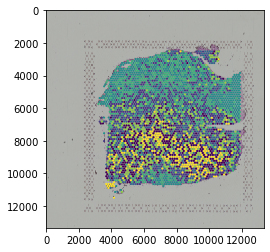

In [175]:
kmeans_constrained_counts_transformed_151669_without_morphological_features, kmeans_constrained_151669_with_morphological_features, frame_kmeans_constrained_151669_without_morphological_features = kmeans_constrained(counts, latent_space, img)

### GMM

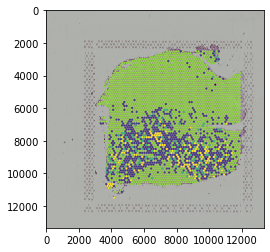

In [165]:
gmm_151669_without_morphological_features, gmm_labels_151669_without_morphological_features, frame_gmm_151669_without_morphological_features = perform_gmm(counts, latent_space, img)

## Calculate ARI

## Preprocess counts df

In [177]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_151669_with_morphological_features['cluster'])
counts_cluster_kmeans_151669_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_151669_with_morphological_features['cluster'])
kmeans_plus_151669_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_151669_with_morphological_features['cluster'])
kmeans_constrained_151669_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_151669_with_morphological_features['cluster'])
gmm_151669_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_151669_without_morphological_features['cluster'])
kmeans_151669_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_151669_without_morphological_features['cluster'])
kmeans_plus_151669_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_151669_without_morphological_features['cluster'])
kmeans_constrained_151669_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_151669_without_morphological_features['cluster'])
gmm_151669_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_151669_without_morphological_features

,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1
AAACACCAATAACTGC-1,5
AAACAGAGCGACTCCT-1,5
AAACAGGGTCTATATT-1,1
AAACATTTCCCGGATT-1,1
...,...
TTGTTGTGTGTCAAGA-1,4
TTGTTTCACATCCAGG-1,1
TTGTTTCATTAGTCTA-1,1
TTGTTTCCATACAACT-1,5


In [178]:
counts_cluster

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8505,10162,0,0,0,5,0.0,0.0,0,1
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9571,4446,2,2,2,5,6.0,6.0,2,5
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4192,9620,4,4,4,5,6.0,6.0,4,5
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8133,4036,0,0,0,5,0.0,0.0,0,1
AAACATTTCCCGGATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9822,9815,6,6,6,5,0.0,0.0,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,6225,8446,5,5,5,1,0.0,0.0,5,4
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9455,6029,5,5,5,6,0.0,0.0,5,1
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9692,5203,5,5,5,1,0.0,0.0,5,1
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7895,5000,1,1,1,6,6.0,6.0,1,5


In [168]:
gmm_151669_with_morphological_features

,cluster_gmm
AAACAAGTATCTCCCA-1,5
AAACACCAATAACTGC-1,5
AAACAGAGCGACTCCT-1,5
AAACAGGGTCTATATT-1,5
AAACATTTCCCGGATT-1,5
...,...
TTGTTGTGTGTCAAGA-1,1
TTGTTTCACATCCAGG-1,6
TTGTTTCATTAGTCTA-1,1
TTGTTTCCATACAACT-1,6


## Preprocess AnnData object

In [179]:
visium_data_151669.obs['cluster_kmeans'] = counts_cluster_kmeans_151669_with_morphological_features
visium_data_151669.obs['cluster_kmeans_plus'] = kmeans_plus_151669_with_morphological_features
visium_data_151669.obs['cluster_kmeans_constrained'] = kmeans_constrained_151669_with_morphological_features
visium_data_151669.obs['cluster_gmm'] = gmm_151669_with_morphological_features
visium_data_151669.obs['cluster_kmeans_without_morpho'] = kmeans_151669_without_morphological_features
visium_data_151669.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_151669_without_morphological_features
visium_data_151669.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_151669_without_morphological_features
visium_data_151669.obs['cluster_gmm_without_morpho'] = gmm_151669_without_morphological_features

In [170]:
visium_data_151669.obs

,in_tissue,array_row,array_col,ground_truth,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1,50,102,Layer4,0,0,0,5,0.0,0.0,0,1
AAACACCAATAACTGC-1,1,59,19,Layer6,2,2,2,5,6.0,6.0,2,5
AAACAGAGCGACTCCT-1,1,14,94,Layer3,4,4,4,5,6.0,6.0,4,5
AAACAGGGTCTATATT-1,1,47,13,Layer4,0,0,0,5,0.0,0.0,0,1
AAACATTTCCCGGATT-1,1,61,97,Layer6,6,6,6,5,0.0,0.0,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,Layer3,5,5,5,1,0.0,0.0,5,4
TTGTTTCACATCCAGG-1,1,58,42,Layer6,5,5,5,6,0.0,0.0,5,1
TTGTTTCATTAGTCTA-1,1,60,30,Layer6,5,5,5,1,0.0,0.0,5,1
TTGTTTCCATACAACT-1,1,45,27,Layer5,1,1,1,6,6.0,6.0,1,5


In [180]:
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['ground_truth'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_kmeans'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_kmeans_plus'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_kmeans_constrained'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_gmm'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_kmeans_without_morpho'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_151669 = visium_data_151669[~pd.isnull(visium_data_151669.obs['cluster_gmm_without_morpho'])]

In [181]:
ARI_1 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_kmeans'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_1'] = ARI_1
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_kmeans_plus'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_kmeans_constrained'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_gmm'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_kmeans_without_morpho'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_kmeans_plus_without_morpho'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_kmeans_constrained_without_morpho'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_151669.obs['cluster_gmm_without_morpho'], visium_data_151669.obs['ground_truth'])
visium_data_151669.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

ARI_cluster_kmeans: 0.10614683904765121
ARI_cluster_kmeans_plus: 0.10614683904765121
ARI_cluster_kmeans_constrained: 0.10614683904765121
cluster_gmm: 0.002495079311573275
ARI_cluster_kmeans_without_morpho: 0.3237338746000316
ARI_cluster_kmeans_plus_without_morpho: 0.3237338746000316
ARI_cluster_kmeans_constrained_without_morpho: 0.10614683904765121
ARI_cluster_gmm_without_morpho: 0.3466546083280615


/tmp/ipykernel_77/3469962591.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  visium_data_151669.uns['ARI_1'] = ARI_1
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


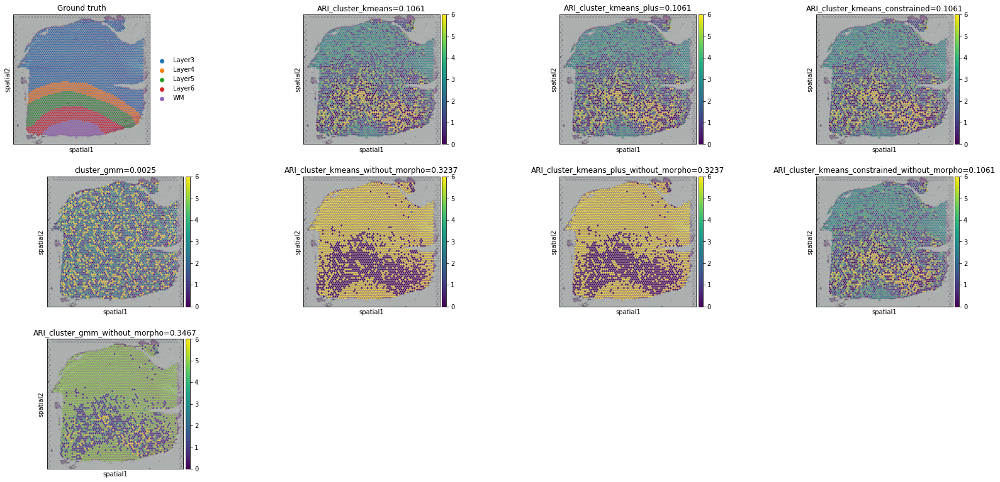

In [182]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_151669,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)

# Mouse brain

## Import and preprocess data

In [395]:
visium_data_Mouse_Brain = sc.read_visium("visium/V1_Mouse_Brain_Sagittal_Anterior/")
img = cv2.imread(f'visium/V1_Mouse_Brain_Sagittal_Anterior/spatial/V1_Mouse_Brain_Sagittal_Anterior_image.tif')
counts = pd.read_csv("dataframe/V1_Mouse_Brain_Sagittal_Anterior_counts_with_probes.csv", index_col=0)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [396]:
visium_data_Mouse_Brain = sc.read_visium("visium/V1_Mouse_Brain_Sagittal_Anterior/")

In [397]:
counts.shape

(2695, 32287)

In [398]:
visium_data_Mouse_Brain

AnnData object with n_obs × n_vars = 2695 × 32285
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [399]:
file_fold = "metadata_DPLFC"

##  With mopho features

In [419]:
dataset_with_morphological_features = "Mouse_brain_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/V1_Mouse_Brain_Sagittal_Anterior_merged_DR_morph_features.csv", index_col=0)

In [401]:
merged_dr_morpho_df

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,...,Texture inertia,Max Intensity,Mean Intensity,Min Intensity,Modus,Texture Anisotropy,Texture Entropy,Texture Major Axis,Texture Major Direction,Texture Minor Axis
0,-0.573126,8.515974,-2.523334,-7.038520,-3.723629,13.069116,-1.607762,-5.686988,8.842394,0.219365,...,1.694053,8.463478,8.463478,8.463478,8.463478,9.992007e-16,2.201911,0.847026,0.000000,0.847026
1,-1.741356,26.674007,-7.685328,-22.076292,-11.563720,41.046898,-5.159363,-17.710700,27.596750,0.698771,...,785.610516,8.463478,8.463478,8.463478,8.463478,6.937575e-01,8.134993,601.427792,2.583386,184.182724
2,-1.091505,16.597954,-4.825043,-13.725579,-7.214374,25.516869,-3.187452,-11.035514,17.179129,0.433588,...,885.555036,8.463478,8.463478,8.463478,8.463478,7.766132e-01,8.088048,723.855314,6.964668,161.699722
3,-1.903581,29.103045,-8.372910,-24.098562,-12.617466,44.792720,-5.645346,-19.324207,30.114601,0.765375,...,1.694053,216.069748,126.438364,37.493279,53.014085,9.992007e-16,2.201911,0.847026,0.000000,0.847026
4,-1.728412,26.482843,-7.631544,-21.918812,-11.480980,40.752970,-5.124880,-17.584368,27.399649,0.695698,...,1.694053,197.334015,131.355343,51.085419,118.925344,9.992007e-16,2.201911,0.847026,0.000000,0.847026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2690,-1.149713,17.437965,-5.062972,-14.426801,-7.578719,26.813726,-3.352597,-11.593264,18.056328,0.455185,...,8599.597890,209.260574,85.995817,11.242430,55.380752,1.801532e-01,10.745636,4725.451539,116.350516,3874.146351
2691,-1.137274,17.271350,-5.017653,-14.286088,-7.505095,26.553604,-3.317937,-11.481319,17.876274,0.450514,...,6274.430926,201.753326,104.933505,31.453369,53.863447,3.567096e-01,10.645106,3818.211913,34.283073,2456.219013
2692,-0.916796,13.833118,-4.038710,-11.438725,-6.021115,21.258629,-2.647523,-9.207987,14.327358,0.361300,...,6872.899345,186.278442,105.535974,48.999390,48.999390,6.963331e-02,10.423721,3560.411276,102.466020,3312.488068
2693,-0.578285,8.586126,-2.547946,-7.094100,-3.757149,13.173068,-1.617814,-5.731052,8.909100,0.221683,...,3142.680237,219.403305,115.912024,36.838921,91.706293,1.437797e-01,9.583445,1693.053460,157.573984,1449.626777


## Normalize data

In [420]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

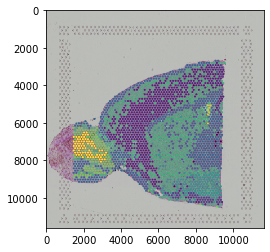

In [421]:
kmeans_counts_transformed_Mouse_brain_with_morphological_features, kmeans_Mouse_brain_with_morphological_features, frame_kmeans_Mouse_brain_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df_transformed, img)

### kmeans ++

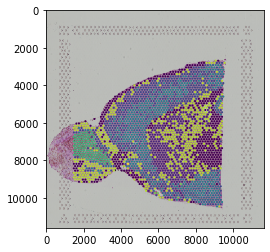

In [422]:
kmeans_plus_counts_transformed_Mouse_brain_with_morphological_features, kmeans_plus_Mouse_brain_with_morphological_features, frame_kmeans_plus_Mouse_brain_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df_transformed, img)

### kmeans constrained

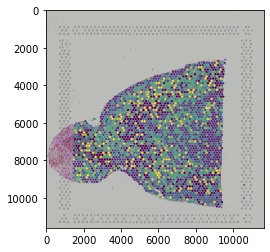

In [423]:
kmeans_constrained_counts_transformed_Mouse_brain_with_morphological_features, kmeans_constrained_Mouse_brain_with_morphological_features, frame_kmeans_constrained_Mouse_brain_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df_transformed, img)

### GMM

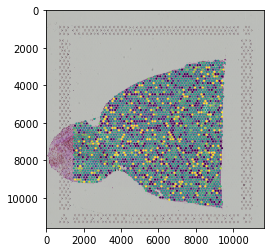

In [424]:
gmm_Mouse_brain_with_morphological_features,gmm_labels_Mouse_brain_with_morphological_features,frame_gmm_Mouse_brain_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [425]:
dataset_without_morphological_features = "V1_Mouse_brain_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/_1_mouse_brain_latent_space.csv")

## Perform clustering 

### kmeans

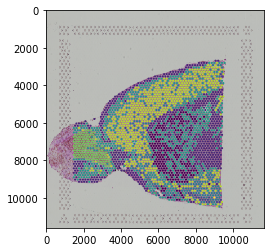

In [444]:
kmeans_counts_transformed_Mouse_brain_without_morphological_features, kmeans_Mouse_brain_without_morphological_features, frame_kmeans_Mouse_brain_without_morphological_features = perform_kmeans(counts, latent_space, img)

### kmeans ++

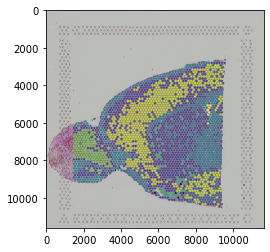

In [445]:
kmeans_plus_counts_transformed_Mouse_brain_without_morphological_features, kmeans_plus_Mouse_brain_without_morphological_features, frame_kmeans_plus_Mouse_brain_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space, img)

### kmeans constrained

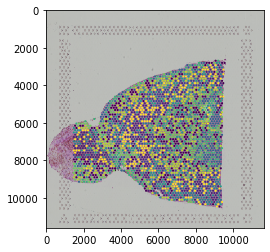

In [413]:
kmeans_constrained_counts_transformed_Mouse_brain_with_morphological_features, kmeans_constrained_Mouse_brain_without_morphological_features, frame_kmeans_constrained_Mouse_brain_without_morphological_features = kmeans_constrained(counts, latent_space, img)

### GMM

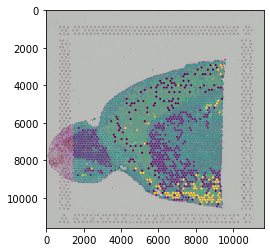

In [412]:
gmm_Mouse_brain_without_morphological_features, gmm_labels_Mouse_brain_without_morphological_features, frame_gmm_Mouse_brain_without_morphological_features = perform_gmm(counts, latent_space, img)

## Calculate ARI

## Preprocess counts df

In [428]:
counts_cluster = counts.copy()

In [431]:
counts_cluster_kmeans_Mouse_brain_with_morphological_features = list(frame_kmeans_Mouse_brain_with_morphological_features['cluster'])
counts_cluster_kmeans_Mouse_brain_with_morphological_features

[3.0,
 7.0,
 1.0,
 9.0,
 9.0,
 7.0,
 5.0,
 1.0,
 3.0,
 2.0,
 3.0,
 6.0,
 5.0,
 6.0,
 5.0,
 3.0,
 6.0,
 3.0,
 7.0,
 2.0,
 1.0,
 1.0,
 1.0,
 6.0,
 3.0,
 6.0,
 6.0,
 6.0,
 6.0,
 3.0,
 6.0,
 5.0,
 3.0,
 6.0,
 3.0,
 1.0,
 9.0,
 1.0,
 2.0,
 3.0,
 1.0,
 3.0,
 3.0,
 1.0,
 1.0,
 3.0,
 6.0,
 3.0,
 3.0,
 3.0,
 3.0,
 1.0,
 3.0,
 6.0,
 6.0,
 3.0,
 6.0,
 1.0,
 6.0,
 6.0,
 6.0,
 6.0,
 7.0,
 6.0,
 1.0,
 1.0,
 1.0,
 3.0,
 6.0,
 6.0,
 1.0,
 3.0,
 5.0,
 6.0,
 3.0,
 1.0,
 2.0,
 6.0,
 3.0,
 3.0,
 3.0,
 1.0,
 3.0,
 5.0,
 3.0,
 2.0,
 3.0,
 6.0,
 1.0,
 6.0,
 5.0,
 3.0,
 6.0,
 6.0,
 6.0,
 3.0,
 6.0,
 3.0,
 6.0,
 6.0,
 6.0,
 6.0,
 3.0,
 6.0,
 3.0,
 1.0,
 3.0,
 6.0,
 3.0,
 3.0,
 1.0,
 6.0,
 6.0,
 3.0,
 3.0,
 6.0,
 3.0,
 3.0,
 7.0,
 6.0,
 6.0,
 1.0,
 1.0,
 6.0,
 5.0,
 1.0,
 3.0,
 5.0,
 6.0,
 6.0,
 1.0,
 1.0,
 9.0,
 3.0,
 3.0,
 3.0,
 3.0,
 6.0,
 3.0,
 5.0,
 1.0,
 7.0,
 3.0,
 3.0,
 3.0,
 7.0,
 6.0,
 6.0,
 1.0,
 1.0,
 3.0,
 1.0,
 1.0,
 7.0,
 5.0,
 2.0,
 5.0,
 6.0,
 6.0,
 6.0,
 3.0,
 6.0,
 6.0,
 6.0,
 3.0,
 5.0,
 3.0

In [430]:
kmeans_plus_Mouse_brain_with_morphological_features = list(frame_kmeans_plus_Mouse_brain_with_morphological_features['cluster'])
kmeans_plus_Mouse_brain_with_morphological_features

[8.0,
 4.0,
 2.0,
 6.0,
 6.0,
 8.0,
 4.0,
 4.0,
 8.0,
 7.0,
 8.0,
 1.0,
 4.0,
 2.0,
 3.0,
 0.0,
 1.0,
 8.0,
 2.0,
 3.0,
 2.0,
 4.0,
 4.0,
 8.0,
 8.0,
 8.0,
 8.0,
 8.0,
 1.0,
 0.0,
 1.0,
 3.0,
 0.0,
 2.0,
 0.0,
 4.0,
 6.0,
 4.0,
 3.0,
 0.0,
 2.0,
 0.0,
 0.0,
 4.0,
 2.0,
 0.0,
 8.0,
 8.0,
 8.0,
 0.0,
 8.0,
 4.0,
 0.0,
 2.0,
 8.0,
 8.0,
 8.0,
 4.0,
 8.0,
 1.0,
 1.0,
 2.0,
 8.0,
 1.0,
 4.0,
 4.0,
 2.0,
 0.0,
 8.0,
 2.0,
 2.0,
 0.0,
 4.0,
 1.0,
 0.0,
 2.0,
 3.0,
 1.0,
 0.0,
 0.0,
 0.0,
 4.0,
 0.0,
 2.0,
 8.0,
 3.0,
 0.0,
 1.0,
 2.0,
 1.0,
 2.0,
 0.0,
 2.0,
 1.0,
 1.0,
 0.0,
 8.0,
 0.0,
 1.0,
 8.0,
 1.0,
 2.0,
 0.0,
 2.0,
 0.0,
 4.0,
 0.0,
 2.0,
 8.0,
 0.0,
 4.0,
 8.0,
 8.0,
 0.0,
 8.0,
 2.0,
 0.0,
 0.0,
 4.0,
 1.0,
 1.0,
 2.0,
 4.0,
 2.0,
 1.0,
 2.0,
 8.0,
 4.0,
 8.0,
 8.0,
 4.0,
 4.0,
 6.0,
 0.0,
 0.0,
 0.0,
 0.0,
 8.0,
 8.0,
 3.0,
 4.0,
 6.0,
 0.0,
 8.0,
 8.0,
 6.0,
 8.0,
 8.0,
 2.0,
 2.0,
 8.0,
 4.0,
 4.0,
 6.0,
 4.0,
 3.0,
 1.0,
 8.0,
 1.0,
 2.0,
 0.0,
 8.0,
 2.0,
 1.0,
 0.0,
 3.0,
 0.0

In [432]:
kmeans_constrained_Mouse_brain_with_morphological_features = list(frame_kmeans_constrained_Mouse_brain_with_morphological_features['cluster'])
kmeans_constrained_Mouse_brain_with_morphological_features

[7,
 7,
 7,
 8,
 8,
 4,
 0,
 0,
 7,
 3,
 7,
 7,
 7,
 9,
 0,
 1,
 6,
 7,
 7,
 3,
 7,
 0,
 0,
 9,
 5,
 7,
 8,
 5,
 7,
 7,
 7,
 3,
 1,
 4,
 1,
 0,
 0,
 0,
 3,
 1,
 9,
 5,
 1,
 0,
 6,
 1,
 5,
 2,
 5,
 8,
 5,
 0,
 7,
 5,
 6,
 5,
 5,
 7,
 7,
 6,
 4,
 6,
 6,
 6,
 9,
 0,
 4,
 1,
 2,
 9,
 6,
 1,
 9,
 6,
 1,
 0,
 3,
 6,
 5,
 5,
 1,
 9,
 1,
 9,
 2,
 3,
 1,
 6,
 6,
 8,
 6,
 1,
 9,
 8,
 6,
 1,
 7,
 7,
 9,
 7,
 7,
 2,
 1,
 6,
 5,
 0,
 1,
 2,
 2,
 1,
 0,
 6,
 5,
 5,
 5,
 6,
 1,
 1,
 9,
 6,
 6,
 0,
 6,
 6,
 0,
 9,
 1,
 0,
 5,
 5,
 0,
 0,
 3,
 1,
 1,
 1,
 5,
 2,
 2,
 3,
 9,
 0,
 1,
 2,
 2,
 9,
 6,
 2,
 6,
 9,
 2,
 4,
 0,
 9,
 4,
 8,
 0,
 8,
 9,
 2,
 1,
 8,
 8,
 9,
 1,
 8,
 8,
 1,
 7,
 3,
 7,
 2,
 6,
 1,
 6,
 6,
 6,
 7,
 8,
 7,
 7,
 7,
 7,
 7,
 2,
 7,
 7,
 7,
 1,
 4,
 9,
 8,
 7,
 7,
 7,
 7,
 5,
 5,
 7,
 6,
 6,
 7,
 1,
 5,
 6,
 7,
 6,
 6,
 7,
 3,
 0,
 0,
 5,
 0,
 6,
 0,
 2,
 9,
 2,
 2,
 3,
 4,
 0,
 2,
 9,
 5,
 6,
 8,
 0,
 2,
 4,
 0,
 2,
 4,
 5,
 8,
 8,
 3,
 6,
 6,
 1,
 7,
 0,
 7,
 2,
 2,
 5,
 3,
 7,
 1,


In [435]:
gmm_Mouse_brain_with_morphological_features = list(frame_gmm_Mouse_brain_with_morphological_features['cluster'])

In [446]:
kmeans_Mouse_brain_without_morphological_features = list(frame_kmeans_Mouse_brain_without_morphological_features['cluster'])
kmeans_Mouse_brain_without_morphological_features

[4.0,
 7.0,
 8.0,
 7.0,
 7.0,
 2.0,
 8.0,
 8.0,
 4.0,
 0.0,
 4.0,
 2.0,
 8.0,
 2.0,
 6.0,
 4.0,
 6.0,
 4.0,
 7.0,
 3.0,
 8.0,
 8.0,
 8.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 6.0,
 4.0,
 2.0,
 6.0,
 4.0,
 2.0,
 4.0,
 8.0,
 7.0,
 8.0,
 3.0,
 4.0,
 8.0,
 4.0,
 4.0,
 8.0,
 8.0,
 4.0,
 2.0,
 4.0,
 4.0,
 4.0,
 4.0,
 8.0,
 4.0,
 2.0,
 2.0,
 4.0,
 2.0,
 8.0,
 2.0,
 2.0,
 6.0,
 2.0,
 2.0,
 2.0,
 8.0,
 8.0,
 8.0,
 4.0,
 2.0,
 2.0,
 2.0,
 4.0,
 8.0,
 2.0,
 4.0,
 8.0,
 3.0,
 2.0,
 4.0,
 4.0,
 4.0,
 8.0,
 4.0,
 8.0,
 4.0,
 3.0,
 4.0,
 2.0,
 8.0,
 2.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 4.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 2.0,
 4.0,
 2.0,
 4.0,
 8.0,
 4.0,
 2.0,
 4.0,
 4.0,
 8.0,
 2.0,
 2.0,
 4.0,
 4.0,
 2.0,
 4.0,
 4.0,
 7.0,
 2.0,
 2.0,
 8.0,
 8.0,
 2.0,
 6.0,
 8.0,
 4.0,
 8.0,
 2.0,
 2.0,
 8.0,
 8.0,
 7.0,
 4.0,
 4.0,
 4.0,
 4.0,
 2.0,
 4.0,
 3.0,
 8.0,
 7.0,
 4.0,
 4.0,
 4.0,
 7.0,
 2.0,
 4.0,
 8.0,
 8.0,
 4.0,
 8.0,
 8.0,
 7.0,
 8.0,
 8.0,
 6.0,
 2.0,
 2.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 4.0,
 3.0,
 4.0

In [447]:
list(frame_kmeans_plus_Mouse_brain_without_morphological_features['cluster'])

[4.0,
 7.0,
 8.0,
 7.0,
 7.0,
 2.0,
 8.0,
 8.0,
 4.0,
 0.0,
 4.0,
 2.0,
 8.0,
 2.0,
 6.0,
 4.0,
 6.0,
 4.0,
 7.0,
 3.0,
 8.0,
 8.0,
 8.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 6.0,
 4.0,
 2.0,
 6.0,
 4.0,
 2.0,
 4.0,
 8.0,
 7.0,
 8.0,
 3.0,
 4.0,
 8.0,
 4.0,
 4.0,
 8.0,
 8.0,
 4.0,
 2.0,
 4.0,
 4.0,
 4.0,
 4.0,
 8.0,
 4.0,
 2.0,
 2.0,
 4.0,
 2.0,
 8.0,
 2.0,
 2.0,
 6.0,
 2.0,
 2.0,
 2.0,
 8.0,
 8.0,
 8.0,
 4.0,
 2.0,
 2.0,
 2.0,
 4.0,
 8.0,
 2.0,
 4.0,
 8.0,
 3.0,
 2.0,
 4.0,
 4.0,
 4.0,
 8.0,
 4.0,
 8.0,
 4.0,
 3.0,
 4.0,
 2.0,
 8.0,
 2.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 4.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 2.0,
 4.0,
 2.0,
 4.0,
 8.0,
 4.0,
 2.0,
 4.0,
 4.0,
 8.0,
 2.0,
 2.0,
 4.0,
 4.0,
 2.0,
 4.0,
 4.0,
 7.0,
 2.0,
 2.0,
 8.0,
 8.0,
 2.0,
 6.0,
 8.0,
 4.0,
 8.0,
 2.0,
 2.0,
 8.0,
 8.0,
 7.0,
 4.0,
 4.0,
 4.0,
 4.0,
 2.0,
 4.0,
 3.0,
 8.0,
 7.0,
 4.0,
 4.0,
 4.0,
 7.0,
 2.0,
 4.0,
 8.0,
 8.0,
 4.0,
 8.0,
 8.0,
 7.0,
 8.0,
 8.0,
 6.0,
 2.0,
 2.0,
 2.0,
 4.0,
 2.0,
 2.0,
 2.0,
 4.0,
 3.0,
 4.0

In [ ]:
frame_kmeans_Mouse_brain_without_morphological_features

In [448]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_Mouse_brain_with_morphological_features['cluster'])
counts_cluster_kmeans_Mouse_brain_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_Mouse_brain_with_morphological_features['cluster'])
kmeans_plus_Mouse_brain_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_Mouse_brain_with_morphological_features['cluster'])
kmeans_constrained_Mouse_brain_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_Mouse_brain_with_morphological_features['cluster'])
gmm_Mouse_brain_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_Mouse_brain_without_morphological_features['cluster'])
kmeans_Mouse_brain_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_Mouse_brain_without_morphological_features['cluster'])
kmeans_plus_Mouse_brain_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_Mouse_brain_without_morphological_features['cluster'])
kmeans_constrained_Mouse_brain_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_Mouse_brain_without_morphological_features['cluster'])
gmm_Mouse_brain_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_Mouse_brain_without_morphological_features

,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,5
AAACACCAATAACTGC-1,2
AAACAGAGCGACTCCT-1,6
AAACAGCTTTCAGAAG-1,3
AAACAGGGTCTATATT-1,2
...,...
TTGTGTTTCCCGAAAG-1,0
TTGTTCAGTGTGCTAC-1,0
TTGTTGTGTGTCAAGA-1,0
TTGTTTCACATCCAGG-1,5


In [449]:
counts_cluster

,Xkr4,Gm1992,Gm19938,Gm37381,Rp1,Sox17,Gm37587,Gm37323,Mrpl15,Lypla1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,7474,8500,3.0,8.0,7,8,4.0,4.0,7,5
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,...,8552,2788,7.0,4.0,7,8,7.0,7.0,1,2
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,2.0,...,3163,7950,1.0,2.0,7,8,8.0,8.0,2,6
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,6636,2100,9.0,6.0,8,7,7.0,7.0,4,3
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,7115,2375,9.0,6.0,8,7,7.0,7.0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTTTCCCGAAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7594,5541,1.0,2.0,6,6,8.0,8.0,5,0
TTGTTCAGTGTGCTAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,...,4361,5885,1.0,2.0,6,6,8.0,8.0,5,0
TTGTTGTGTGTCAAGA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5199,6780,6.0,2.0,6,5,2.0,2.0,5,0
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,8433,4371,3.0,8.0,2,1,4.0,4.0,0,5


In [337]:
gmm_Mouse_brain_with_morphological_features

,cluster_gmm
AAACAAGTATCTCCCA-1,1
AAACACCAATAACTGC-1,12
AAACAGAGCGACTCCT-1,3
AAACAGCTTTCAGAAG-1,12
AAACAGGGTCTATATT-1,12
...,...
TTGTGTTTCCCGAAAG-1,0
TTGTTCAGTGTGCTAC-1,0
TTGTTGTGTGTCAAGA-1,0
TTGTTTCACATCCAGG-1,11


## Preprocess AnnData object

In [450]:
visium_data_Mouse_Brain.obs['cluster_kmeans'] = counts_cluster_kmeans_Mouse_brain_with_morphological_features
visium_data_Mouse_Brain.obs['cluster_kmeans_plus'] = kmeans_plus_Mouse_brain_with_morphological_features
visium_data_Mouse_Brain.obs['cluster_kmeans_constrained'] = kmeans_constrained_Mouse_brain_with_morphological_features
visium_data_Mouse_Brain.obs['cluster_gmm'] = gmm_Mouse_brain_with_morphological_features
visium_data_Mouse_Brain.obs['cluster_kmeans_without_morpho'] = kmeans_Mouse_brain_without_morphological_features
visium_data_Mouse_Brain.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_Mouse_brain_without_morphological_features
visium_data_Mouse_Brain.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_Mouse_brain_without_morphological_features
visium_data_Mouse_Brain.obs['cluster_gmm_without_morpho'] = gmm_Mouse_brain_without_morphological_features

In [451]:
visium_data_Mouse_Brain.obs

,in_tissue,array_row,array_col,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1,50,102,3.0,8.0,7,8,4.0,4.0,7,5
AAACACCAATAACTGC-1,1,59,19,7.0,4.0,7,8,7.0,7.0,1,2
AAACAGAGCGACTCCT-1,1,14,94,1.0,2.0,7,8,8.0,8.0,2,6
AAACAGCTTTCAGAAG-1,1,43,9,9.0,6.0,8,7,7.0,7.0,4,3
AAACAGGGTCTATATT-1,1,47,13,9.0,6.0,8,7,7.0,7.0,1,2
...,...,...,...,...,...,...,...,...,...,...,...
TTGTGTTTCCCGAAAG-1,1,51,59,1.0,2.0,6,6,8.0,8.0,5,0
TTGTTCAGTGTGCTAC-1,1,24,64,1.0,2.0,6,6,8.0,8.0,5,0
TTGTTGTGTGTCAAGA-1,1,31,77,6.0,2.0,6,5,2.0,2.0,5,0
TTGTTTCACATCCAGG-1,1,58,42,3.0,8.0,2,1,4.0,4.0,0,5


In [452]:
metadata_brain = pd.read_csv("metadata_DPLFC/metadata_V1_Mouse_Brain_Sagittal_Anterior.tsv", sep = "\t", index_col = 0)

In [361]:
metadata_brain

,in_tissue,array_row,array_col,ground_truth_1,ground_truth_2,ground_truth_3,ground_truth_3_group,ground_truth_4,ground_truth
AAACAAGTATCTCCCA-1,1,50,102,STR,CPu,CPu,CPu,Pal::GPi,Pal::GPi
AAACACCAATAACTGC-1,1,59,19,OB,MOB,MOB::Gl_1,MOB::Gl,MOB::Gl_1,MOB::Gl_1
AAACAGAGCGACTCCT-1,1,14,94,CTX,SS,SS::L2/3,SS::L2/3,SS::L2/3,SS::L2/3
AAACAGCTTTCAGAAG-1,1,43,9,OB,MOB,MOB::Gr,MOB::Gr,MOB::Gr,MOB::Gr
AAACAGGGTCTATATT-1,1,47,13,OB,MOB,MOB::Gr,MOB::Gr,MOB::Gr,MOB::Gr
...,...,...,...,...,...,...,...,...,...
TTGTGTTTCCCGAAAG-1,1,51,59,CTX,PIR,PIR,PIR,PIR,PIR
TTGTTCAGTGTGCTAC-1,1,24,64,CTX,MO,MO::L5,MO::L5,MO::L5,MO::L5
TTGTTGTGTGTCAAGA-1,1,31,77,CTX,MO,MO::L6,MO::L6,MO::L6,MO::L6
TTGTTTCACATCCAGG-1,1,58,42,CTX,AON,AON::L1_1,AON::L1,AON::L1_1,AON::L1_1


In [453]:
visium_data_Mouse_brain = visium_data_Mouse_Brain

In [468]:
visium_data_Mouse_brain.obs['ground_truth'] = metadata_brain['ground_truth_1']

In [469]:
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['ground_truth'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_kmeans'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_kmeans_plus'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_kmeans_constrained'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_gmm'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_kmeans_without_morpho'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_Mouse_brain = visium_data_Mouse_brain[~pd.isnull(visium_data_Mouse_brain.obs['cluster_gmm_without_morpho'])]

In [470]:
ARI_1 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_kmeans'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_1'] = ARI_1
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_kmeans_plus'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_kmeans_constrained'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_gmm'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_kmeans_without_morpho'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_kmeans_plus_without_morpho'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_kmeans_constrained_without_morpho'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_Mouse_brain.obs['cluster_gmm_without_morpho'], visium_data_Mouse_brain.obs['ground_truth'])
visium_data_Mouse_brain.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

ARI_cluster_kmeans: 0.1892709421073334
ARI_cluster_kmeans_plus: 0.15005789591626853
ARI_cluster_kmeans_constrained: 0.020326176518308446
cluster_gmm: -0.002301698904930548
ARI_cluster_kmeans_without_morpho: 0.12903801905915188
ARI_cluster_kmeans_plus_without_morpho: 0.12903801905915188
ARI_cluster_kmeans_constrained_without_morpho: 0.021482137254014082
ARI_cluster_gmm_without_morpho: 0.1595135635708937


/tmp/ipykernel_77/4272476331.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  visium_data_Mouse_brain.uns['ARI_1'] = ARI_1
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


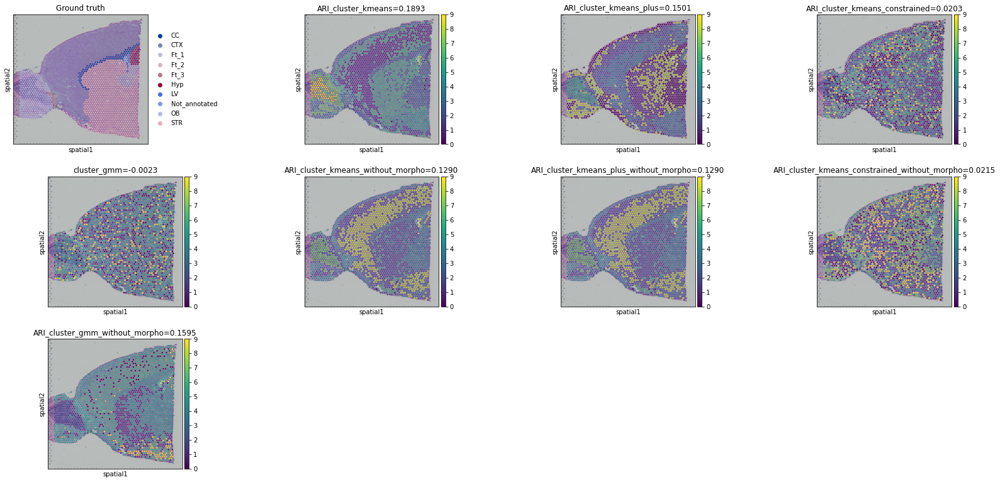

In [471]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_Mouse_brain,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)

# RE 151673

# 151673

## Import and preprocess data

In [187]:
visium_data_151673 = sc.read_visium("visium/151673/")
img = cv2.imread(f'visium/151673/spatial/151673.tif')
counts = pd.read_csv("dataframe/DPLFC_151673_counts_with_probes.csv", index_col=0)

In [188]:
visium_data_151673

AnnData object with n_obs × n_vars = 3639 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [189]:
file_fold = "metadata_DPLFC"

In [190]:
# add ground_truth
df_meta = pd.read_csv(file_fold + '/metadata_151673.tsv', sep='\t')
df_meta_layer = df_meta['layer_guess']
visium_data_151673.obs['ground_truth'] = df_meta_layer.values

##  With mopho features

In [191]:
dataset_with_morphological_features = "151673_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/151673_merged_DR_morph_features.csv", index_col=0)

## Normalize data

In [192]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

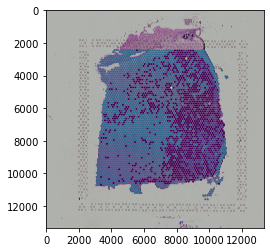

In [193]:
kmeans_counts_transformed_151673_with_morphological_features, kmeans_151673_with_morphological_features, frame_kmeans_151673_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df_transformed, img)

### kmeans ++

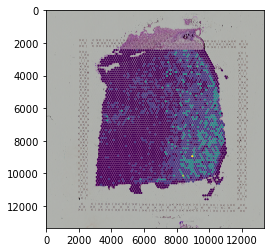

In [194]:
kmeans_plus_counts_transformed_151673_with_morphological_features, kmeans_plus_151673_with_morphological_features, frame_kmeans_plus_151673_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df_transformed, img)

### kmeans constrained

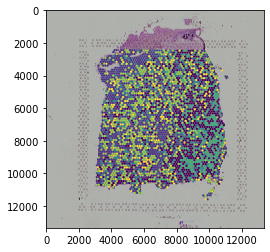

In [195]:
kmeans_constrained_counts_transformed_151673_with_morphological_features, kmeans_constrained_151673_with_morphological_features, frame_kmeans_constrained_151673_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df_transformed, img)

### GMM

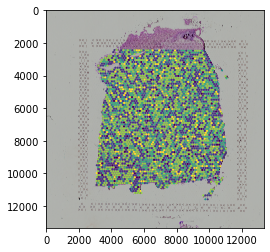

In [196]:
gmm_151673_with_morphological_features,gmm_labels_151673_with_morphological_features,frame_gmm_151673_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [200]:
dataset_without_morphological_features = "_151673_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/_1_DPLFC_151673_latent_space.csv")

In [201]:
#standardize
mms = StandardScaler()
mms.fit(latent_space)
latent_space_transformed = mms.transform(latent_space)

## Perform clustering 

### kmeans

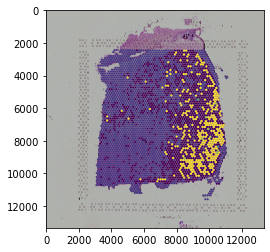

In [202]:
kmeans_counts_transformed_151673_without_morphological_features, kmeans_151673_without_morphological_features, frame_kmeans_151673_without_morphological_features = perform_kmeans(counts, latent_space_transformed, img)

### kmeans ++

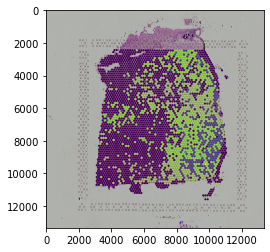

In [203]:
kmeans_plus_counts_transformed_151673_without_morphological_features, kmeans_plus_151673_without_morphological_features, frame_kmeans_plus_151673_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space_transformed, img)

### kmeans constrained

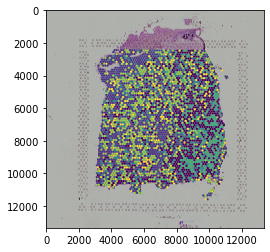

In [204]:
kmeans_constrained_counts_transformed_151673_with_morphological_features, kmeans_constrained_151673_with_morphological_features, frame_kmeans_constrained_151673_without_morphological_features = kmeans_constrained(counts, latent_space_transformed, img)

### GMM

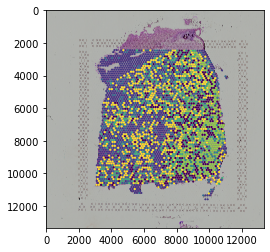

In [205]:
gmm_151673_without_morphological_features, gmm_labels_151673_without_morphological_features, frame_gmm_151673_without_morphological_features = perform_gmm(counts, latent_space_transformed, img)

## Calculate ARI

## Preprocess counts df

In [206]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_151673_with_morphological_features['cluster'])
counts_cluster_kmeans_151673_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_151673_with_morphological_features['cluster'])
kmeans_plus_151673_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_151673_with_morphological_features['cluster'])
kmeans_constrained_151673_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_151673_with_morphological_features['cluster'])
gmm_151673_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_151673_without_morphological_features['cluster'])
kmeans_151673_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_151673_without_morphological_features['cluster'])
kmeans_plus_151673_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_151673_without_morphological_features['cluster'])
kmeans_constrained_151673_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_151673_without_morphological_features['cluster'])
gmm_151673_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_151673_without_morphological_features

,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,5
AAACAATCTACTAGCA-1,1
AAACACCAATAACTGC-1,4
AAACAGAGCGACTCCT-1,4
AAACAGCTTTCAGAAG-1,4
...,...
TTGTTTCACATCCAGG-1,6
TTGTTTCATTAGTCTA-1,1
TTGTTTCCATACAACT-1,1
TTGTTTGTATTACACG-1,1


In [207]:
counts_cluster

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8468,9791,1.0,3.0,3,0,6.0,1.0,3,5
AAACAATCTACTAGCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2807,5769,2.0,0.0,2,6,1.0,0.0,2,1
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9505,4068,2.0,0.0,3,0,1.0,0.0,3,4
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4151,9271,0.0,1.0,2,6,0.0,5.0,2,4
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7583,3393,2.0,0.0,5,5,0.0,5.0,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9396,5653,2.0,0.0,6,4,1.0,0.0,6,6
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9630,4825,2.0,0.0,6,4,1.0,0.0,6,1
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7831,4631,2.0,0.0,1,4,1.0,0.0,1,1
TTGTTTGTATTACACG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11193,5571,2.0,0.0,1,5,1.0,0.0,1,1


In [208]:
gmm_151673_with_morphological_features

,cluster_gmm
AAACAAGTATCTCCCA-1,0
AAACAATCTACTAGCA-1,6
AAACACCAATAACTGC-1,0
AAACAGAGCGACTCCT-1,6
AAACAGCTTTCAGAAG-1,5
...,...
TTGTTTCACATCCAGG-1,4
TTGTTTCATTAGTCTA-1,4
TTGTTTCCATACAACT-1,4
TTGTTTGTATTACACG-1,5


## Preprocess AnnData object

In [209]:
visium_data_151673.obs['cluster_kmeans'] = counts_cluster_kmeans_151673_with_morphological_features
visium_data_151673.obs['cluster_kmeans_plus'] = kmeans_plus_151673_with_morphological_features
visium_data_151673.obs['cluster_kmeans_constrained'] = kmeans_constrained_151673_with_morphological_features
visium_data_151673.obs['cluster_gmm'] = gmm_151673_with_morphological_features
visium_data_151673.obs['cluster_kmeans_without_morpho'] = kmeans_151673_without_morphological_features
visium_data_151673.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_151673_without_morphological_features
visium_data_151673.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_151673_without_morphological_features
visium_data_151673.obs['cluster_gmm_without_morpho'] = gmm_151673_without_morphological_features

In [210]:
visium_data_151673.obs

,in_tissue,array_row,array_col,ground_truth,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1,50,102,Layer3,1.0,3.0,3,0,6.0,1.0,3,5
AAACAATCTACTAGCA-1,1,3,43,Layer1,2.0,0.0,2,6,1.0,0.0,2,1
AAACACCAATAACTGC-1,1,59,19,WM,2.0,0.0,3,0,1.0,0.0,3,4
AAACAGAGCGACTCCT-1,1,14,94,Layer3,0.0,1.0,2,6,0.0,5.0,2,4
AAACAGCTTTCAGAAG-1,1,43,9,Layer5,2.0,0.0,5,5,0.0,5.0,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,WM,2.0,0.0,6,4,1.0,0.0,6,6
TTGTTTCATTAGTCTA-1,1,60,30,WM,2.0,0.0,6,4,1.0,0.0,6,1
TTGTTTCCATACAACT-1,1,45,27,Layer6,2.0,0.0,1,4,1.0,0.0,1,1
TTGTTTGTATTACACG-1,1,73,41,WM,2.0,0.0,1,5,1.0,0.0,1,1


In [211]:
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['ground_truth'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_plus'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_constrained'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_gmm'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_without_morpho'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_151673 = visium_data_151673[~pd.isnull(visium_data_151673.obs['cluster_gmm_without_morpho'])]

In [212]:
ARI_1 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_1'] = ARI_1
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_plus'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_constrained'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_gmm'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_plus_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_kmeans_constrained_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_151673.obs['cluster_gmm_without_morpho'], visium_data_151673.obs['ground_truth'])
visium_data_151673.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

ARI_cluster_kmeans: 0.035897372083570966
ARI_cluster_kmeans_plus: 0.0363647462184078
ARI_cluster_kmeans_constrained: 0.030820063254210817
cluster_gmm: -0.0004766744166245313
ARI_cluster_kmeans_without_morpho: 0.04231448779251846
ARI_cluster_kmeans_plus_without_morpho: 0.038369129836345446
ARI_cluster_kmeans_constrained_without_morpho: 0.030820063254210817
ARI_cluster_gmm_without_morpho: 0.03472591123016684


/tmp/ipykernel_77/4109085208.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  visium_data_151673.uns['ARI_1'] = ARI_1
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


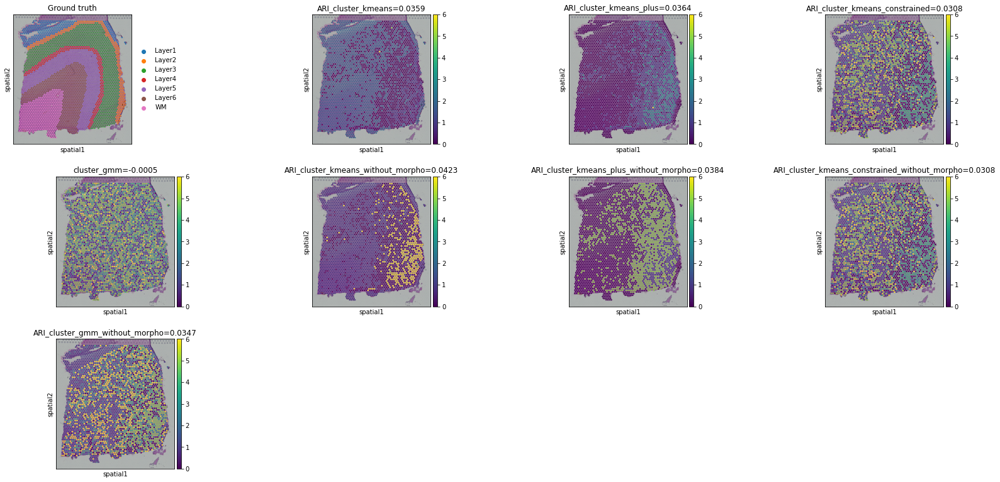

In [213]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_151673,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)

# 151671

## Import and preprocess data

In [214]:
visium_data_151671 = sc.read_visium("visium/151671/")
img = cv2.imread(f'visium/151671/spatial/151671.tif')
counts = pd.read_csv("dataframe/DPLFC_151671_counts_with_probes.csv", index_col=0)

/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [215]:
visium_data_151671

AnnData object with n_obs × n_vars = 4110 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [216]:
file_fold = "metadata_DPLFC"

In [217]:
# add ground_truth
df_meta = pd.read_csv(file_fold + '/metadata_151671.tsv', sep='\t')
df_meta_layer = df_meta['layer_guess']
visium_data_151671.obs['ground_truth'] = df_meta_layer.values

##  With mopho features

In [218]:
dataset_with_morphological_features = "151671_with_morphological_features"
merged_dr_morpho_df = pd.read_csv("merged_DR_morpho_features/151671_merged_DR_morph_features.csv", index_col=0)

## Normalize data

In [219]:
#standardize
mms = StandardScaler()
mms.fit(merged_dr_morpho_df)
merged_dr_morpho_df_transformed = mms.transform(merged_dr_morpho_df)

## Perform clustering 

### kmeans

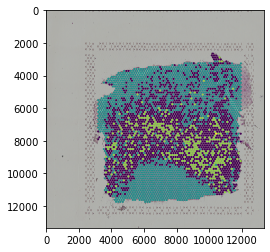

In [220]:
kmeans_counts_transformed_151671_with_morphological_features, kmeans_151671_with_morphological_features, frame_kmeans_151671_with_morphological_features = perform_kmeans(counts, merged_dr_morpho_df_transformed, img)

### kmeans ++

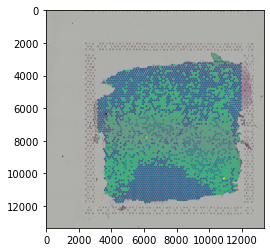

In [221]:
kmeans_plus_counts_transformed_151671_with_morphological_features, kmeans_plus_151671_with_morphological_features, frame_kmeans_plus_151671_with_morphological_features = perform_kmeans_plus_plus(counts, merged_dr_morpho_df_transformed, img)

### kmeans constrained

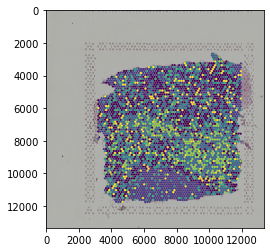

In [222]:
kmeans_constrained_counts_transformed_151671_with_morphological_features, kmeans_constrained_151671_with_morphological_features, frame_kmeans_constrained_151671_with_morphological_features = kmeans_constrained(counts, merged_dr_morpho_df_transformed, img)

### GMM

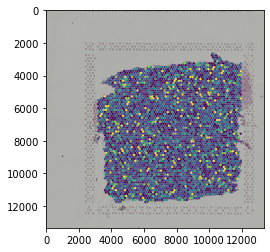

In [223]:
gmm_151671_with_morphological_features,gmm_labels_151671_with_morphological_features,frame_gmm_151671_with_morphological_features = perform_gmm(counts, merged_dr_morpho_df_transformed, img)

## Without morpho features

In [224]:
dataset_without_morphological_features = "_151671_without_morphological_features"
latent_space = pd.read_csv("/../../sbgenomics/project-files/data/latent_space/DPLFC_151671_latent_space.csv")

In [225]:
#standardize
mms = StandardScaler()
mms.fit(latent_space)
latent_space_transformed = mms.transform(latent_space)

## Perform clustering 

### kmeans

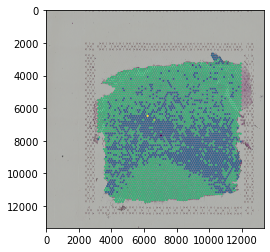

In [226]:
kmeans_counts_transformed_151671_without_morphological_features, kmeans_151671_without_morphological_features, frame_kmeans_151671_without_morphological_features = perform_kmeans(counts, latent_space_transformed, img)

### kmeans ++

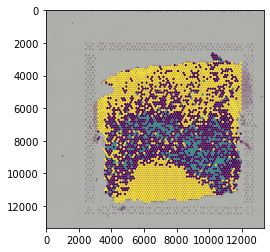

In [227]:
kmeans_plus_counts_transformed_151671_without_morphological_features, kmeans_plus_151671_without_morphological_features, frame_kmeans_plus_151671_without_morphological_features = perform_kmeans_plus_plus(counts, latent_space_transformed, img)

### kmeans constrained

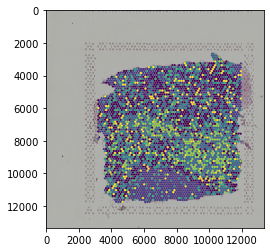

In [228]:
kmeans_constrained_counts_transformed_151671_with_morphological_features, kmeans_constrained_151671_with_morphological_features, frame_kmeans_constrained_151671_without_morphological_features = kmeans_constrained(counts, latent_space_transformed, img)

### GMM

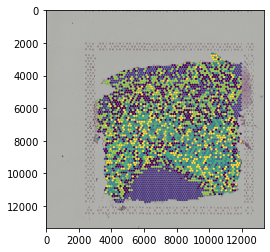

In [229]:
gmm_151671_without_morphological_features, gmm_labels_151671_without_morphological_features, frame_gmm_151671_without_morphological_features = perform_gmm(counts, latent_space_transformed, img)

## Calculate ARI

## Preprocess counts df

In [230]:
counts_cluster = counts.copy()
counts_cluster['cluster_kmeans']=list(frame_kmeans_151671_with_morphological_features['cluster'])
counts_cluster_kmeans_151671_with_morphological_features = counts_cluster[["cluster_kmeans"]].copy()
#
counts_cluster['cluster_kmeans_plus']=list(frame_kmeans_plus_151671_with_morphological_features['cluster'])
kmeans_plus_151671_with_morphological_features = counts_cluster[["cluster_kmeans_plus"]].copy()

counts_cluster['cluster_kmeans_constrained']=list(frame_kmeans_constrained_151671_with_morphological_features['cluster'])
kmeans_constrained_151671_with_morphological_features = counts_cluster[["cluster_kmeans_constrained"]].copy()

counts_cluster['cluster_gmm']=list(frame_gmm_151671_with_morphological_features['cluster'])
gmm_151671_with_morphological_features = counts_cluster[["cluster_gmm"]].copy()

counts_cluster['cluster_kmeans_without_morpho']=list(frame_kmeans_151671_without_morphological_features['cluster'])
kmeans_151671_without_morphological_features = counts_cluster[["cluster_kmeans_without_morpho"]].copy()

counts_cluster['cluster_kmeans_plus_without_morpho']=list(frame_kmeans_plus_151671_without_morphological_features['cluster'])
kmeans_plus_151671_without_morphological_features = counts_cluster[["cluster_kmeans_plus_without_morpho"]].copy()

counts_cluster['cluster_kmeans_constrained_without_morpho']=list(frame_kmeans_constrained_151671_without_morphological_features['cluster'])
kmeans_constrained_151671_without_morphological_features = counts_cluster[["cluster_kmeans_constrained_without_morpho"]].copy()

counts_cluster['cluster_gmm_without_morpho']=list(frame_gmm_151671_without_morphological_features['cluster'])
gmm_151671_without_morphological_features = counts_cluster[["cluster_gmm_without_morpho"]].copy()

gmm_151671_without_morphological_features

,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,2
AAACACCAATAACTGC-1,3
AAACAGAGCGACTCCT-1,4
AAACAGCTTTCAGAAG-1,4
AAACAGGGTCTATATT-1,4
...,...
TTGTTTCACATCCAGG-1,0
TTGTTTCATTAGTCTA-1,0
TTGTTTCCATACAACT-1,0
TTGTTTGTATTACACG-1,1


In [231]:
counts_cluster

,MIR1302-2HG,FAM138A,OR4F5,AL627309.1,AL627309.3,AL627309.2,AL627309.4,AL732372.1,OR4F29,AC114498.1,...,y_coord,x_coord,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8636,10214,5.0,3.0,5,4,2.0,3.0,5,2
AAACACCAATAACTGC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9702,4497,0.0,4.0,2,2,2.0,0.0,2,3
AAACAGAGCGACTCCT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4322,9672,5.0,3.0,2,2,2.0,3.0,2,4
AAACAGCTTTCAGAAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7784,3813,5.0,3.0,5,0,2.0,3.0,5,4
AAACAGGGTCTATATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8264,4087,5.0,3.0,4,4,2.0,3.0,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9586,6081,3.0,2.0,0,1,4.0,6.0,0,0
TTGTTTCATTAGTCTA-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9824,5255,0.0,4.0,0,1,4.0,0.0,0,0
TTGTTTCCATACAACT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8026,5052,3.0,2.0,0,0,4.0,6.0,0,0
TTGTTTGTATTACACG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11383,6009,3.0,2.0,1,0,4.0,6.0,1,1


In [232]:
gmm_151671_with_morphological_features

,cluster_gmm
AAACAAGTATCTCCCA-1,4
AAACACCAATAACTGC-1,2
AAACAGAGCGACTCCT-1,2
AAACAGCTTTCAGAAG-1,0
AAACAGGGTCTATATT-1,4
...,...
TTGTTTCACATCCAGG-1,1
TTGTTTCATTAGTCTA-1,1
TTGTTTCCATACAACT-1,0
TTGTTTGTATTACACG-1,0


## Preprocess AnnData object

In [233]:
visium_data_151671.obs['cluster_kmeans'] = counts_cluster_kmeans_151671_with_morphological_features
visium_data_151671.obs['cluster_kmeans_plus'] = kmeans_plus_151671_with_morphological_features
visium_data_151671.obs['cluster_kmeans_constrained'] = kmeans_constrained_151671_with_morphological_features
visium_data_151671.obs['cluster_gmm'] = gmm_151671_with_morphological_features
visium_data_151671.obs['cluster_kmeans_without_morpho'] = kmeans_151671_without_morphological_features
visium_data_151671.obs['cluster_kmeans_plus_without_morpho'] = kmeans_plus_151671_without_morphological_features
visium_data_151671.obs['cluster_kmeans_constrained_without_morpho'] = kmeans_constrained_151671_without_morphological_features
visium_data_151671.obs['cluster_gmm_without_morpho'] = gmm_151671_without_morphological_features

In [234]:
visium_data_151671.obs

,in_tissue,array_row,array_col,ground_truth,cluster_kmeans,cluster_kmeans_plus,cluster_kmeans_constrained,cluster_gmm,cluster_kmeans_without_morpho,cluster_kmeans_plus_without_morpho,cluster_kmeans_constrained_without_morpho,cluster_gmm_without_morpho
AAACAAGTATCTCCCA-1,1,50,102,Layer5,5.0,3.0,5,4,2.0,3.0,5,2
AAACACCAATAACTGC-1,1,59,19,Layer6,0.0,4.0,2,2,2.0,0.0,2,3
AAACAGAGCGACTCCT-1,1,14,94,Layer3,5.0,3.0,2,2,2.0,3.0,2,4
AAACAGCTTTCAGAAG-1,1,43,9,Layer5,5.0,3.0,5,0,2.0,3.0,5,4
AAACAGGGTCTATATT-1,1,47,13,Layer5,5.0,3.0,4,4,2.0,3.0,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTTCACATCCAGG-1,1,58,42,Layer6,3.0,2.0,0,1,4.0,6.0,0,0
TTGTTTCATTAGTCTA-1,1,60,30,Layer6,0.0,4.0,0,1,4.0,0.0,0,0
TTGTTTCCATACAACT-1,1,45,27,Layer5,3.0,2.0,0,0,4.0,6.0,0,0
TTGTTTGTATTACACG-1,1,73,41,WM,3.0,2.0,1,0,4.0,6.0,1,1


In [235]:
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['ground_truth'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_plus'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_constrained'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_gmm'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_without_morpho'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_plus_without_morpho'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_kmeans_constrained_without_morpho'])]
visium_data_151671 = visium_data_151671[~pd.isnull(visium_data_151671.obs['cluster_gmm_without_morpho'])]

In [236]:
ARI_1 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_1'] = ARI_1
print('ARI_cluster_kmeans:', ARI_1)
ARI_2 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_plus'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_2'] = ARI_2
print('ARI_cluster_kmeans_plus:', ARI_2)
ARI_3 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_constrained'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_3'] = ARI_3
print('ARI_cluster_kmeans_constrained:', ARI_3)
ARI_4 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_gmm'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_'] = ARI_4
print('cluster_gmm:', ARI_4)
ARI_5 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_5'] = ARI_5
print('ARI_cluster_kmeans_without_morpho:', ARI_5)
ARI_6 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_plus_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_6'] = ARI_6
print('ARI_cluster_kmeans_plus_without_morpho:', ARI_6)
ARI_7 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_kmeans_constrained_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_7'] = ARI_7
print('ARI_cluster_kmeans_constrained_without_morpho:', ARI_7)
ARI_8 = metrics.adjusted_rand_score(visium_data_151671.obs['cluster_gmm_without_morpho'], visium_data_151671.obs['ground_truth'])
visium_data_151671.uns['ARI_8'] = ARI_8
print('ARI_cluster_gmm_without_morpho:', ARI_8)

ARI_cluster_kmeans: 0.11124889994253917
ARI_cluster_kmeans_plus: 0.11120113355581217
ARI_cluster_kmeans_constrained: 0.06760490710317697
cluster_gmm: -0.0013389536033941666
ARI_cluster_kmeans_without_morpho: 0.10744304844459178
ARI_cluster_kmeans_plus_without_morpho: 0.11155160090803298
ARI_cluster_kmeans_constrained_without_morpho: 0.06760490710317697
ARI_cluster_gmm_without_morpho: 0.11219661684544807


/tmp/ipykernel_77/1066818747.py:2: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  visium_data_151671.uns['ARI_1'] = ARI_1
/opt/conda/lib/python3.9/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


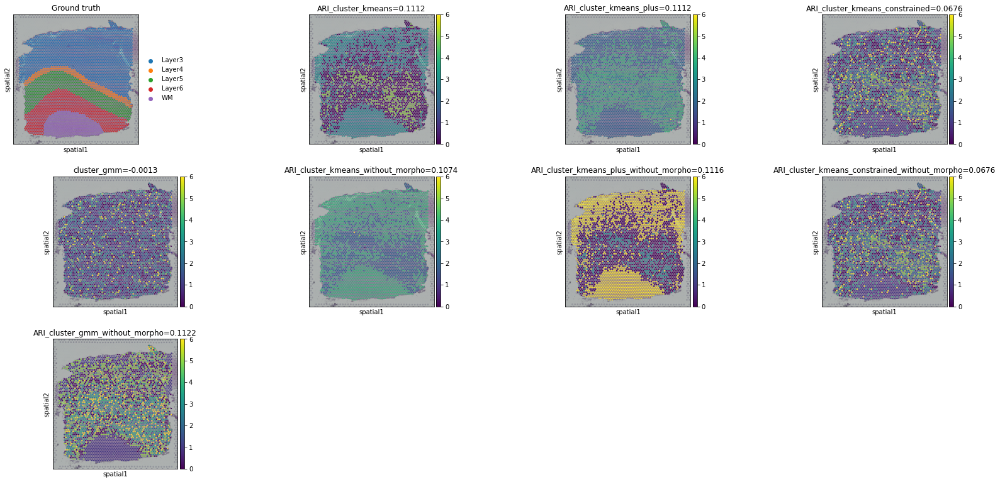

In [237]:
# plotting spatial clustering result
sc.pl.spatial(visium_data_151671,
              img_key="hires",
              color=["ground_truth", "cluster_kmeans", "cluster_kmeans_plus","cluster_kmeans_constrained","cluster_gmm","cluster_kmeans_without_morpho","cluster_kmeans_plus_without_morpho","cluster_kmeans_constrained_without_morpho","cluster_gmm_without_morpho"],
              title=["Ground truth", "ARI_cluster_kmeans=%.4f"%ARI_1,"ARI_cluster_kmeans_plus=%.4f"%ARI_2,"ARI_cluster_kmeans_constrained=%.4f"%ARI_3,"cluster_gmm=%.4f"%ARI_4,"ARI_cluster_kmeans_without_morpho=%.4f"%ARI_5,"ARI_cluster_kmeans_plus_without_morpho=%.4f"%ARI_6,"ARI_cluster_kmeans_constrained_without_morpho=%.4f"%ARI_7,"ARI_cluster_gmm_without_morpho=%.4f"%ARI_8],
              show=True)